segmentasi dg warna

https://www.youtube.com/watch?v=hQ-bpfdWQh8

https://www.youtube.com/watch?v=SJCu1d4xakQ

https://pyimagesearch.com/2016/02/15/determining-object-color-with-opencv/

## bagian 3 : fine tuning
SAM bisa melakukan
* Zero-shot generalization : bisa melakukan segment object dimana sblmnya tdk pernah ada objek tersebut (unseen) tanpa perlu melakukan training
* Ambiguity awareness : meskipun objeknya overlap bisa terdeteksi
* bisa berjln real time

input dari SAM adlh gambar dan teks

arsitekturnya

<img src="https://viso.ai/wp-content/smush-webp/2023/12/architecture-segment-anything-model-sam-1060x226.jpg.webp">

gambar di encode menjadi vektor berdimensi tinggi(image embedding)

SAM menerima prompt bisa berupa point (koordinat), box (bounding box), teks. prompt ini di encode menjd vektor yg terpisah dari gambar

sehingga ada 2 encode yaitu gambar dan prompt

* encoder untuk gambar menggunakan model vision transformer (ViT-H) yg mrpkn pretrained model

* encoder untuk prompt menggunakan encoder teks sederhana yg akan mengonversi input prompt menjd vektor
* mask encoder menggunakan lightweight transformer yg memprediksi object mask dari gambar dan prompt embedding

fine-tuning hanya dibagian mask decoder, dimana custom image yg dihubungkan dg masknya

jika tdk ada maka bounding box untuk setiap objek perlu dihitung dan akan digunakan sebagai prompt


https://www.youtube.com/watch?v=83tnWs_YBRQ

https://www.datacamp.com/tutorial/sam2-fine-tuning

sumber

https://www.tensorflow.org/tutorials/images/segmentation

https://freedium.cfd/https://khadkechetan.medium.com/natural-language-to-sql-query-using-an-open-source-llm-6b4b91a5519a

# [advanced rag](https://huggingface.co/learn/cookbook/advanced_rag)

In [ ]:
!pip install -q torch transformers transformers accelerate bitsandbytes langchain sentence-transformers faiss-gpu openpyxl pacmap datasets langchain-community ragatouille

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 9.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 493.0/493.0 kB 31.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.5/27.5 MB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 34.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from tqdm.notebook import tqdm
import pandas as pd
from typing import Optional, List, Tuple
from datasets import Dataset
import matplotlib.pyplot as plt

pd.set_option("display.max_colwidth", None)  # This will be helpful when visualizing retriever outputs

In [ ]:
import datasets

ds = datasets.load_dataset("m-ric/huggingface_doc", split="train")

README.md:   0%|          | 0.00/21.0 [00:00<?, ?B/s]

huggingface_doc.csv:   0%|          | 0.00/22.0M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/2647 [00:00<?, ? examples/s]

In [ ]:
ds

Dataset({
    features: ['text', 'source'],
    num_rows: 2647
})

In [ ]:
from langchain.docstore.document import Document as LangchainDocument

RAW_KNOWLEDGE_BASE = [
    LangchainDocument(page_content=doc["text"], metadata={"source": doc["source"]}) for doc in tqdm(ds)
]

  0%|          | 0/2647 [00:00<?, ?it/s]

In [ ]:
from langchain.text_splitter import RecursiveCharacterTextSplitter

# We use a hierarchical list of separators specifically tailored for splitting Markdown documents
# This list is taken from LangChain's MarkdownTextSplitter class
MARKDOWN_SEPARATORS = [
    "\n#{1,6} ",
    "```\n",
    "\n\\*\\*\\*+\n",
    "\n---+\n",
    "\n___+\n",
    "\n\n",
    "\n",
    " ",
    "",
]

text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=1000,  # The maximum number of characters in a chunk: we selected this value arbitrarily
    chunk_overlap=100,  # The number of characters to overlap between chunks
    add_start_index=True,  # If `True`, includes chunk's start index in metadata
    strip_whitespace=True,  # If `True`, strips whitespace from the start and end of every document
    separators=MARKDOWN_SEPARATORS,
)

docs_processed = []
for doc in RAW_KNOWLEDGE_BASE:
    docs_processed += text_splitter.split_documents([doc])

modules.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/68.1k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/57.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/583 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/66.7M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/394 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/712k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Model's maximum sequence length: 512


  0%|          | 0/31085 [00:00<?, ?it/s]

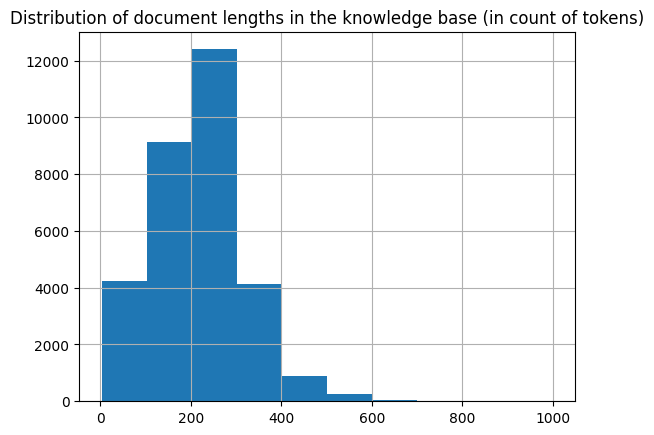

In [ ]:
from sentence_transformers import SentenceTransformer

# To get the value of the max sequence_length, we will query the underlying `SentenceTransformer` object used in the RecursiveCharacterTextSplitter
print(f"Model's maximum sequence length: {SentenceTransformer('thenlper/gte-small').max_seq_length}")

from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained("thenlper/gte-small")
lengths = [len(tokenizer.encode(doc.page_content)) for doc in tqdm(docs_processed)]

# Plot the distribution of document lengths, counted as the number of tokens
fig = pd.Series(lengths).hist()
plt.title("Distribution of document lengths in the knowledge base (in count of tokens)")
plt.show()

  0%|          | 0/17995 [00:00<?, ?it/s]

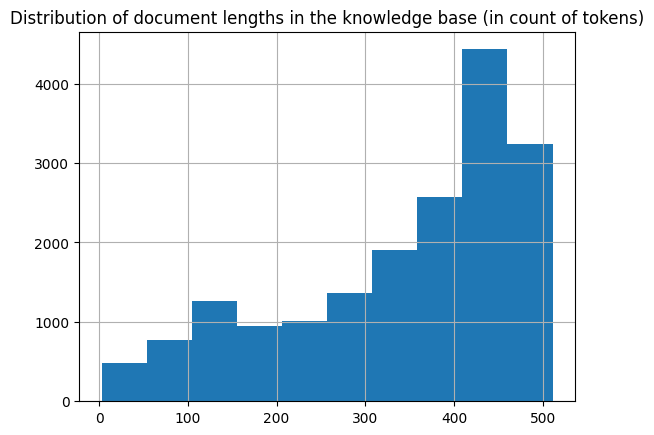

In [ ]:
from langchain.text_splitter import RecursiveCharacterTextSplitter
from transformers import AutoTokenizer

EMBEDDING_MODEL_NAME = "thenlper/gte-small"


def split_documents(
    chunk_size: int,
    knowledge_base: List[LangchainDocument],
    tokenizer_name: Optional[str] = EMBEDDING_MODEL_NAME,
) -> List[LangchainDocument]:
    """
    Split documents into chunks of maximum size `chunk_size` tokens and return a list of documents.
    """
    text_splitter = RecursiveCharacterTextSplitter.from_huggingface_tokenizer(
        AutoTokenizer.from_pretrained(tokenizer_name),
        chunk_size=chunk_size,
        chunk_overlap=int(chunk_size / 10),
        add_start_index=True,
        strip_whitespace=True,
        separators=MARKDOWN_SEPARATORS,
    )

    docs_processed = []
    for doc in knowledge_base:
        docs_processed += text_splitter.split_documents([doc])

    # Remove duplicates
    unique_texts = {}
    docs_processed_unique = []
    for doc in docs_processed:
        if doc.page_content not in unique_texts:
            unique_texts[doc.page_content] = True
            docs_processed_unique.append(doc)

    return docs_processed_unique


docs_processed = split_documents(
    512,  # We choose a chunk size adapted to our model
    RAW_KNOWLEDGE_BASE,
    tokenizer_name=EMBEDDING_MODEL_NAME,
)

# Let's visualize the chunk sizes we would have in tokens from a common model
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained(EMBEDDING_MODEL_NAME)
lengths = [len(tokenizer.encode(doc.page_content)) for doc in tqdm(docs_processed)]
fig = pd.Series(lengths).hist()
plt.title("Distribution of document lengths in the knowledge base (in count of tokens)")
plt.show()

In [ ]:
from langchain.vectorstores import FAISS
from langchain_community.embeddings import HuggingFaceEmbeddings
from langchain_community.vectorstores.utils import DistanceStrategy

embedding_model = HuggingFaceEmbeddings(
    model_name=EMBEDDING_MODEL_NAME,
    multi_process=True,
    model_kwargs={"device": "cuda"},
    encode_kwargs={"normalize_embeddings": True},  # Set `True` for cosine similarity
)

KNOWLEDGE_VECTOR_DATABASE = FAISS.from_documents(
    docs_processed, embedding_model, distance_strategy=DistanceStrategy.COSINE
)

<ipython-input-30-630fad0d9693>:5: LangChainDeprecationWarning: The class `HuggingFaceEmbeddings` was deprecated in LangChain 0.2.2 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-huggingface package and should be used instead. To use it run `pip install -U :class:`~langchain-huggingface` and import as `from :class:`~langchain_huggingface import HuggingFaceEmbeddings``.
  embedding_model = HuggingFaceEmbeddings(


In [ ]:
# Embed a user query in the same space
user_query = "How to create a pipeline object?"
query_vector = embedding_model.embed_query(user_query)

In [ ]:
import pacmap
import numpy as np
import plotly.express as px

embedding_projector = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0, random_state=1)

embeddings_2d = [
    list(KNOWLEDGE_VECTOR_DATABASE.index.reconstruct_n(idx, 1)[0]) for idx in range(len(docs_processed))
] + [query_vector]

# Fit the data (the index of transformed data corresponds to the index of the original data)
documents_projected = embedding_projector.fit_transform(np.array(embeddings_2d), init="pca")

In [ ]:
df = pd.DataFrame.from_dict(
    [
        {
            "x": documents_projected[i, 0],
            "y": documents_projected[i, 1],
            "source": docs_processed[i].metadata["source"].split("/")[1],
            "extract": docs_processed[i].page_content[:100] + "...",
            "symbol": "circle",
            "size_col": 4,
        }
        for i in range(len(docs_processed))
    ]
    + [
        {
            "x": documents_projected[-1, 0],
            "y": documents_projected[-1, 1],
            "source": "User query",
            "extract": user_query,
            "size_col": 100,
            "symbol": "star",
        }
    ]
)

# Visualize the embedding
fig = px.scatter(
    df,
    x="x",
    y="y",
    color="source",
    hover_data="extract",
    size="size_col",
    symbol="symbol",
    color_discrete_map={"User query": "black"},
    width=1000,
    height=700,
)
fig.update_traces(
    marker=dict(opacity=1, line=dict(width=0, color="DarkSlateGrey")),
    selector=dict(mode="markers"),
)
fig.update_layout(
    legend_title_text="<b>Chunk source</b>",
    title="<b>2D Projection of Chunk Embeddings via PaCMAP</b>",
)
fig.show()

In [ ]:
print(f"\nStarting retrieval for {user_query=}...")
retrieved_docs = KNOWLEDGE_VECTOR_DATABASE.similarity_search(query=user_query, k=5)
print("\n==================================Top document==================================")
print(retrieved_docs[0].page_content)
print("==================================Metadata==================================")
print(retrieved_docs[0].metadata)

In [ ]:
from transformers import pipeline
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig

READER_MODEL_NAME = "HuggingFaceH4/zephyr-7b-beta"

bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_use_double_quant=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.bfloat16,
)
model = AutoModelForCausalLM.from_pretrained(READER_MODEL_NAME, quantization_config=bnb_config)
tokenizer = AutoTokenizer.from_pretrained(READER_MODEL_NAME)

READER_LLM = pipeline(
    model=model,
    tokenizer=tokenizer,
    task="text-generation",
    do_sample=True,
    temperature=0.2,
    repetition_penalty=1.1,
    return_full_text=False,
    max_new_tokens=500,
)

In [ ]:
READER_LLM("What is 4+4? Answer:")

In [ ]:
prompt_in_chat_format = [
    {
        "role": "system",
        "content": """Using the information contained in the context,
give a comprehensive answer to the question.
Respond only to the question asked, response should be concise and relevant to the question.
Provide the number of the source document when relevant.
If the answer cannot be deduced from the context, do not give an answer.""",
    },
    {
        "role": "user",
        "content": """Context:
{context}
---
Now here is the question you need to answer.

Question: {question}""",
    },
]
RAG_PROMPT_TEMPLATE = tokenizer.apply_chat_template(
    prompt_in_chat_format, tokenize=False, add_generation_prompt=True
)
print(RAG_PROMPT_TEMPLATE)

In [ ]:
retrieved_docs_text = [doc.page_content for doc in retrieved_docs]  # We only need the text of the documents
context = "\nExtracted documents:\n"
context += "".join([f"Document {str(i)}:::\n" + doc for i, doc in enumerate(retrieved_docs_text)])

final_prompt = RAG_PROMPT_TEMPLATE.format(question="How to create a pipeline object?", context=context)

# Redact an answer
answer = READER_LLM(final_prompt)[0]["generated_text"]
print(answer)

In [ ]:
from ragatouille import RAGPretrainedModel

RERANKER = RAGPretrainedModel.from_pretrained("colbert-ir/colbertv2.0")

In [ ]:
from transformers import Pipeline


def answer_with_rag(
    question: str,
    llm: Pipeline,
    knowledge_index: FAISS,
    reranker: Optional[RAGPretrainedModel] = None,
    num_retrieved_docs: int = 30,
    num_docs_final: int = 5,
) -> Tuple[str, List[LangchainDocument]]:
    # Gather documents with retriever
    print("=> Retrieving documents...")
    relevant_docs = knowledge_index.similarity_search(query=question, k=num_retrieved_docs)
    relevant_docs = [doc.page_content for doc in relevant_docs]  # Keep only the text

    # Optionally rerank results
    if reranker:
        print("=> Reranking documents...")
        relevant_docs = reranker.rerank(question, relevant_docs, k=num_docs_final)
        relevant_docs = [doc["content"] for doc in relevant_docs]

    relevant_docs = relevant_docs[:num_docs_final]

    # Build the final prompt
    context = "\nExtracted documents:\n"
    context += "".join([f"Document {str(i)}:::\n" + doc for i, doc in enumerate(relevant_docs)])

    final_prompt = RAG_PROMPT_TEMPLATE.format(question=question, context=context)

    # Redact an answer
    print("=> Generating answer...")
    answer = llm(final_prompt)[0]["generated_text"]

    return answer, relevant_docs

In [ ]:
question = "how to create a pipeline object?"

answer, relevant_docs = answer_with_rag(question, READER_LLM, KNOWLEDGE_VECTOR_DATABASE, reranker=RERANKER)

In [ ]:
print("==================================Answer==================================")
print(f"{answer}")
print("==================================Source docs==================================")
for i, doc in enumerate(relevant_docs):
    print(f"Document {i}------------------------------------------------------------")
    print(doc)

# [hybrid RAG. error berupa stack dibagian simulasi](https://medium.aiplanet.com/advanced-rag-implementation-on-custom-data-using-hybrid-search-embed-caching-and-mistral-ai-ce78fdae4ef6)

<img src="https://miro.medium.com/v2/resize:fit:828/format:webp/1*pt3GvRsCd12vtlolavMSZg.png">

In [ ]:
!pip install -q git+https://github.com/huggingface/transformers
!pip install -qU langchain Faiss-gpu tiktoken sentence-transformers
!pip install -qU trl Py7zr auto-gptq optimum
!pip install -q rank_bm25
!pip install -q PyPdf

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
!pip install -U langchain-community

In [ ]:
import langchain
from langchain.embeddings import CacheBackedEmbeddings,HuggingFaceEmbeddings
from langchain.vectorstores import FAISS
from langchain.storage import LocalFileStore
from langchain.retrievers import BM25Retriever,EnsembleRetriever
from langchain.document_loaders import PyPDFLoader,DirectoryLoader
from langchain.llms import HuggingFacePipeline
from langchain.cache import InMemoryCache
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain.schema import prompt
from langchain.chains import RetrievalQA
from langchain.callbacks import StdOutCallbackHandler
from langchain import PromptTemplate

from transformers import AutoModelForCausalLM, AutoTokenizer, pipeline

In [ ]:
!wget https://plg.uwaterloo.ca/~gvcormac/cormacksigir09-rrf.pdf

--2024-12-28 07:55:48--  https://plg.uwaterloo.ca/~gvcormac/cormacksigir09-rrf.pdf
Resolving plg.uwaterloo.ca (plg.uwaterloo.ca)... 129.97.186.80
Connecting to plg.uwaterloo.ca (plg.uwaterloo.ca)|129.97.186.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 66196 (65K) [application/pdf]
Saving to: ‘cormacksigir09-rrf.pdf.1’

cormacksigir09-rrf. 100%[===================>]  64.64K   171KB/s    in 0.4s    

2024-12-28 07:55:49 (171 KB/s) - ‘cormacksigir09-rrf.pdf.1’ saved [66196/66196]



ekstrak pdf menjadi dokumen/teks

In [ ]:
dir_loader = DirectoryLoader("/content/",
                             glob="*.pdf",
                             loader_cls=PyPDFLoader)
docs = dir_loader.load()
#
print(f"len of documents in :{len(docs)}")

len of documents in :2


buat chunks untuk review

In [ ]:
text_splitter = RecursiveCharacterTextSplitter(chunk_size=500,
                                      chunk_overlap=200,)
# lakukan chunk ke dokumen
esops_documents = text_splitter.transform_documents(docs)
print(f"number of chunks in barbie documents : {len(esops_documents)}")

number of chunks in barbie documents : 31


buat vector store

In [ ]:
store = LocalFileStore("./cache/")
# model embedding yang digunakan untuk mengubah teks dokumen jadi vektor embedding
embed_model_id = 'BAAI/bge-small-en-v1.5'
core_embeddings_model = HuggingFaceEmbeddings(model_name=embed_model_id)
# CacheBackedEmbeddings mencegah terjadinya embeddding pada query yang mirip
embedder = CacheBackedEmbeddings.from_bytes_store(core_embeddings_model,
                                                  store,
                                                  namespace=embed_model_id)
# Create VectorStore
vectorstore = FAISS.from_documents(esops_documents,embedder)

<ipython-input-8-33bd1bd2faec>:4: LangChainDeprecationWarning: The class `HuggingFaceEmbeddings` was deprecated in LangChain 0.2.2 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-huggingface package and should be used instead. To use it run `pip install -U :class:`~langchain-huggingface` and import as `from :class:`~langchain_huggingface import HuggingFaceEmbeddings``.
  core_embeddings_model = HuggingFaceEmbeddings(model_name=embed_model_id)
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warni

buat sparse embedding

In [ ]:
bm25_retriever = BM25Retriever.from_documents(esops_documents)
bm25_retriever.k=5

cari query pada dokumen untuk mendapatkan respon (retrieve) / jawaban yang mirip dengan query yang diberikan

In [ ]:
query = "Ho to save my excess money?" # yang dicari/query
embedding_vector = core_embeddings_model.embed_query(query) # ubah query jadi embedding
print(len(embedding_vector))
# cari query di dokumen
docs_resp = vectorstore.similarity_search_by_vector(embedding_vector,k=5)
# print out 5 retrieve/jawaban yang mirip dengan query/ yang menjawab query
for page in docs_resp:
  print(page.page_content)
  print("\n")

384
not made or distributed for proﬁt or commercial advantage an d that copies
bear this notice and the full citation on the ﬁrst page. To cop y otherwise, to
republish, to post on servers or to redistribute to lists, re quires prior speciﬁc
permission and/or a fee.
SIGIR'09,July 19–23, 2009, Boston, Massachusetts, USA.
Copyright 2009 ACM 978-1-60558-483-6/09/07 ... $5.00.
lower-ranked documents does not vanish as it would were,
say, an exponential function used. The constantk mitigates


outperforms Condorcet because it is better able to harness
diversity within individual rankings. One or two systems
that rank a document highly can substantially improve its
rank relative to the more popular documents. With Con-
dorcet, a simple majority of weak preferences may overrule
substantially stronger ones.
CombMNZ multiplies the sum of the uncalibrated scores
of individual system by the sum of a binary quantization of
each rank. It is perhaps not surprising that its results have


niﬁcance. D

cek waktu yang diperlukan oleh CacheBackedEmbeddings untuk mencari jawaban

In [ ]:
%%timeit -n 1 -r 1
query = "How to save my excess money?"
#
embedding_vector = core_embeddings_model.embed_query(query)
docs_resp = vectorstore.similarity_search_by_vector(embedding_vector,k=5)

51.4 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


hybrid search dengan EnsembleRetriever

In [ ]:
faiss_retriever = vectorstore.as_retriever(search_kwargs={"k":5})
ensemble_retriever = EnsembleRetriever(retrievers=[bm25_retriever,faiss_retriever],
                                       weights=[0.5,0.5])

download model quantized GPTQ

In [ ]:
from transformers import AutoModelForCausalLM, AutoTokenizer, pipeline

model_name_or_path = "TheBloke/Mistral-7B-Instruct-v0.1-GPTQ"
# To use a different branch, change revision
# For example: revision="gptq-4bit-32g-actorder_True"
model = AutoModelForCausalLM.from_pretrained(model_name_or_path,
                                             device_map="auto",
                                             trust_remote_code=False,
                                             revision="gptq-8bit-32g-actorder_True")
#
tokenizer = AutoTokenizer.from_pretrained(model_name_or_path, use_fast=True)

`loss_type=None` was set in the config but it is unrecognised.Using the default loss: `ForCausalLMLoss`.
Some weights of the model checkpoint at TheBloke/Mistral-7B-Instruct-v0.1-GPTQ were not used when initializing MistralForCausalLM: ['model.layers.0.mlp.down_proj.bias', 'model.layers.0.mlp.gate_proj.bias', 'model.layers.0.mlp.up_proj.bias', 'model.layers.0.self_attn.k_proj.bias', 'model.layers.0.self_attn.o_proj.bias', 'model.layers.0.self_attn.q_proj.bias', 'model.layers.0.self_attn.v_proj.bias', 'model.layers.1.mlp.down_proj.bias', 'model.layers.1.mlp.gate_proj.bias', 'model.layers.1.mlp.up_proj.bias', 'model.layers.1.self_attn.k_proj.bias', 'model.layers.1.self_attn.o_proj.bias', 'model.layers.1.self_attn.q_proj.bias', 'model.layers.1.self_attn.v_proj.bias', 'model.layers.10.mlp.down_proj.bias', 'model.layers.10.mlp.gate_proj.bias', 'model.layers.10.mlp.up_proj.bias', 'model.layers.10.self_attn.k_proj.bias', 'model.layers.10.self_attn.o_proj.bias', 'model.layers.10.self_attn.q_pr

In [ ]:
# BUAT PIPELINE
pipe = pipeline(
    "text-generation",
    model=model,
    tokenizer=tokenizer,
    max_new_tokens=512,
    do_sample=True,
    temperature=0.1,
    top_p=0.95,
    top_k=40,
    repetition_penalty=1.1
)

Device set to use cpu


In [ ]:
# INISIALISASI MDOEL
from langchain.llms import HuggingFacePipeline
llm = HuggingFacePipeline(pipeline=pipe)

<ipython-input-15-2634daf6fed2>:3: LangChainDeprecationWarning: The class `HuggingFacePipeline` was deprecated in LangChain 0.0.37 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-huggingface package and should be used instead. To use it run `pip install -U :class:`~langchain-huggingface` and import as `from :class:`~langchain_huggingface import HuggingFacePipeline``.
  llm = HuggingFacePipeline(pipeline=pipe)


In [ ]:
# SET UP CACHING
langchain.llm_cache = InMemoryCache()

In [ ]:
# BUAT TEMPLATE UNTUK PROMPT
PROMPT_TEMPLATE = '''
You are my financial advisor. You are great at providing tips on investments, savings and on financial markets with your knowledge in finances.
With the information being provided try to answer the question.
If you cant answer the question based on the information either say you cant find an answer or unable to find an answer.
So try to understand in depth about the context and answer only based on the information provided. Dont generate irrelevant answers

Context: {context}
Question: {question}
Do provide only helpful answers

Helpful answer:
'''
#
input_variables = ['context', 'question']
#
custom_prompt = PromptTemplate(template=PROMPT_TEMPLATE,
                            input_variables=input_variables)

Setup Retrieval chain — without Hybrid Search

In [ ]:

handler = StdOutCallbackHandler()
#
qa_with_sources_chain = RetrievalQA.from_chain_type(
    llm=llm,
    chain_type="stuff",
    retriever = vectorstore.as_retriever(search_kwargs={"k":5}),
    verbose=True,
    callbacks=[handler],
    chain_type_kwargs={"prompt": custom_prompt},
    return_source_documents=True
)

SIMULASI QUERY

In [ ]:
# %%timeit
query = "How to save my excess money?"
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")
print("simulasi 1 tanpa hybrid search")

<ipython-input-19-bbf551afbc02>:3: LangChainDeprecationWarning: The method `Chain.__call__` was deprecated in langchain 0.1.0 and will be removed in 1.0. Use :meth:`~invoke` instead.
  response = qa_with_sources_chain({"query":query})
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.




> Entering new RetrievalQA chain...


In [ ]:
print("simulasi 2 tanpa hybrid search")
# %%time
query = "What are the steps to make a financial planning?"
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")

In [ ]:
print("simulasi 3 tanpa hybrid search")
# %%time
query = "Please explain in detail the steps to make a financial planning."
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")
print(f"Number of of Documents returned : {len(response['source_documents'])}")

In [ ]:
print("simulasi 4 tanpa hybrid search")
# %%time
query ="How to plan for retirement while still young?"
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")
print(f"Number of Documents returned : {len(response['source_documents'])}")

Setup Retrieval chain — with Hybrid Search

In [ ]:
# hybrid
handler = StdOutCallbackHandler()
# retriever menggunakan ensemble (hybrid)
qa_with_sources_chain = RetrievalQA.from_chain_type(
    llm=llm,
    chain_type="stuff",
    retriever = ensemble_retriever,
    callbacks=[handler],
    chain_type_kwargs={"prompt": custom_prompt},
    return_source_documents=True
)

In [ ]:
print("simulasi 1 hybrid search")
# %%time
query = "How to save my excess money?"
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")

In [ ]:
print("simulasi 2 hybrid search")
# %%time
query = "What are the steps to make a financial planning?"
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")

In [ ]:
print("simulasi 3 hybrid search")
# %%time
query = "Please explain in detail the steps to make a financial planning."
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")
print(f"Number of of Documents returned : {len(response['source_documents'])}")

In [ ]:
print("simulasi 4 hybrid search")
# %%time
query = "What are the steps to make a financial planning?"
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")

SAMPAI SIMULASI KE 4, YANG HYBRID RESPON NYA LEBIH BAIK DARIPADA YANG TIDAK HYBRID

In [ ]:
print("simulasi 5 hybrid search")
# %%time
query = "How money works for us ?"
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")

In [ ]:
print("simulasi 6 hybrid search")
# %%time
query ="What is the document about?"
response = qa_with_sources_chain({"query":query})
print(f"Response generated : \n {response['result']}")
print(f"Source Documents : \n {response['source_documents']}")
print(f"Number of Documents returned : {len(response['source_documents'])}")

simulasi 5 & 6 waktu eksekusinya lebih cepat karena menggunakan cache

# [rag chatbot llama 3](https://huggingface.co/blog/not-lain/rag-chatbot-using-llama3)

In [ ]:
!pip install -q datasets sentence-transformers faiss-cpu accelerate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.5/27.5 MB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 10.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
from datasets import load_dataset

dataset = load_dataset("not-lain/wikipedia")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/374 [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/35.6M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/3000 [00:00<?, ? examples/s]

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['id', 'url', 'title', 'text'],
        num_rows: 3000
    })
})

data akan diubah menjadi embedding menggunakan model embedding mixedbread-ai/mxbai-embed-large-v1

In [ ]:
from sentence_transformers import SentenceTransformer
ST = SentenceTransformer("mixedbread-ai/mxbai-embed-large-v1")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/266 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/114k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/677 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/670M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/695 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/297 [00:00<?, ?B/s]

In [ ]:
# # lakukan embedding
# def embed(batch):
#     """
#     adds a column to the dataset called 'embeddings'
#     """
#     # or you can combine multiple columns here
#     # For example the title and the text
#     information = batch["text"]
#     return {"embeddings" : ST.encode(information)}

# dataset = dataset.map(embed,batched=True,batch_size=16)

agar lebih cepat maka data hasil embedding kita gunakan yang sudah ada jadi tinggal di load

In [ ]:
# jika ingin push hasil embedding
# dataset.push_to_hub("not-lain/wikipedia", revision="embedded")
# dan jika ingin load
# from datasets import load_dataset
dataset = load_dataset("not-lain/wikipedia",revision = "embedded")

README.md:   0%|          | 0.00/417 [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/49.8M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/3000 [00:00<?, ? examples/s]

tambahkan hasil embedding ke index dari faiss

In [ ]:
data = dataset["train"]
data = data.add_faiss_index("embeddings") # column name that has the embeddings of the dataset

  0%|          | 0/3 [00:00<?, ?it/s]

fungsi yang akan melakukan pencarian

In [ ]:
def search(query: str, k: int = 3 ):
    """a function that embeds a new query and returns the most probable results"""
    embedded_query = ST.encode(query) # embed new query
    scores, retrieved_examples = data.get_nearest_examples( # retrieve results
        "embeddings", embedded_query, # compare our new embedded query with the dataset embeddings
        k=k # get only top k results
    )
    return scores, retrieved_examples

In [ ]:
# search for word anarchy and get the best 4 matching values from the dataset
scores , result = search("anarchy", 4 )
result['title']

['Anarchism', 'Anarcho-capitalism', 'Community', 'Capitalism']

In [ ]:
print(result["text"][0])

Anarchism is a political philosophy and movement that is skeptical of all justifications for authority and seeks to abolish the institutions it claims maintain unnecessary coercion and hierarchy, typically including nation-states, and capitalism. Anarchism advocates for the replacement of the state with stateless societies and voluntary free associations. As a historically left-wing movement, this reading of anarchism is placed on the farthest left of the political spectrum, usually described as the libertarian wing of the socialist movement (libertarian socialism).

Humans have lived in societies without formal hierarchies long before the establishment of states, realms, or empires. With the rise of organised hierarchical bodies, scepticism toward authority also rose. Although traces of anarchist ideas are found all throughout history, modern anarchism emerged from the Enlightenment. During the latter half of the 19th and the first decades of the 20th century, the anarchist movement f

load model untuk tugas q&a

In [ ]:
!pip install -U bitsandbytes

In [ ]:
from google.colab import userdata
from huggingface_hub import login
login(token=userdata.get('token_hf'))

In [ ]:
from transformers import AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig
import torch

model_id = "meta-llama/Meta-Llama-3-8B-Instruct"

# use quantization to lower GPU usage
# bnb_config = BitsAndBytesConfig(
#     load_in_4bit=True, bnb_4bit_use_double_quant=True, bnb_4bit_quant_type="nf4", bnb_4bit_compute_dtype=torch.bfloat16
# )

tokenizer = AutoTokenizer.from_pretrained(model_id)
model = AutoModelForCausalLM.from_pretrained(
    model_id,
    torch_dtype=torch.bfloat16,
    device_map="auto",
    # quantization_config=bnb_config
)
terminators = [
    tokenizer.eos_token_id,
    tokenizer.convert_tokens_to_ids("<|eot_id|>")
]

model.safetensors.index.json:   0%|          | 0.00/23.9k [00:00<?, ?B/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/4.92G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/1.17G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/187 [00:00<?, ?B/s]

buat template prompt

In [ ]:
SYS_PROMPT = """You are an assistant for answering questions.
You are given the extracted parts of a long document and a question. Provide a conversational answer.
If you don't know the answer, just say "I do not know." Don't make up an answer."""

In [ ]:
def format_prompt(prompt,retrieved_documents,k):
  """using the retrieved documents we will prompt the model to generate our responses"""
  PROMPT = f"Question:{prompt}\nContext:"
  for idx in range(k) :
    PROMPT+= f"{retrieved_documents['text'][idx]}\n"
  return PROMPT

def generate(formatted_prompt):
  formatted_prompt = formatted_prompt[:2000] # to avoid GPU OOM
  messages = [{"role":"system","content":SYS_PROMPT},{"role":"user","content":formatted_prompt}]
  # tell the model to generate
  input_ids = tokenizer.apply_chat_template(
      messages,
      add_generation_prompt=True,
      return_tensors="pt"
  ).to(model.device)
  outputs = model.generate(
      input_ids,
      max_new_tokens=1024,
      eos_token_id=terminators,
      do_sample=True,
      temperature=0.6,
      top_p=0.9,
  )
  response = outputs[0][input_ids.shape[-1]:]
  return tokenizer.decode(response, skip_special_tokens=True)

def rag_chatbot(prompt:str,k:int=2):
  scores , retrieved_documents = search(prompt, k)
  formatted_prompt = format_prompt(prompt,retrieved_documents,k)
  return generate(formatted_prompt)

In [ ]:
rag_chatbot("what's anarchy ?", k = 2)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:128009 for open-end generation.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


KeyboardInterrupt: 

# [dasar similiarity dengan huggingface langchain dan faiss](https://medium.com/@venujkvenk/unleashing-the-power-of-text-similarity-a-matchmakers-guide-with-hugging-face-and-langchain-faiss-3cb437135cbd)

In [ ]:
!pip -qq install huggingface-hub
!pip -qq install langchain
!pip -qq install pypdf
!pip -qq install chromadb
!pip -qq install faiss-cpu
!pip -qq install tiktoken
!pip -qq install langchainhub
!pip -qq install langchain_community
!pip -qq install sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 628.3/628.3 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 44.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.6/278.6 kB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 38.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.2/93.2 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 49.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.8/54.8 kB 4.6 MB/s eta 0:00:0

In [ ]:
import os
import numpy as np
from langchain import hub
from langchain_community.embeddings import HuggingFaceHubEmbeddings

HuggingFaceHubEmbeddings adalah class untuk membuat embedding (bentuknya vektor) dari teks/dokumen menggunakan model pretrained (contoh BERT, RoBERTa, GPT). tujuannya untuk mendapatkan informasi semantik dari teks yang diberikan dalam bentuk vektor. untuk membuat teks dari teks yang diinputkan (maksudnya seperti inference) maka panggil fungsi *embed_query()*.

embedding inilah yang digunakan untuk melakukan tugas similarity search

In [ ]:
from google.colab import userdata
# defaultnya menggunakan model sentence-transformers/all-mpnet-base-v2
model = HuggingFaceHubEmbeddings(huggingfacehub_api_token=userdata.get('token_hf'))
# Define your sentences
sentence1 = "The weather is beautiful today."
sentence2 = "It's a perfect day to go for a walk."

# Generate embeddings
embedding1 = model.embed_query(sentence1)
embedding2 = model.embed_query(sentence2)

from sklearn.metrics.pairwise import cosine_similarity
# Calculate similarity (cosine similarity)
similarity = cosine_similarity([embedding1], [embedding2])

print(f"Similarity score: {similarity[0][0]}")

Similarity score: 0.6191339513648726


kita coba gunakan model transformers/all-MiniLM-L6-v2 untuk generate embedding

In [ ]:
from sentence_transformers import SentenceTransformer
sentences = ["This is an example sentence", "Each sentence is converted"]

model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
embeddings = model.encode(sentences) # embedding teks

from sklearn.metrics.pairwise import cosine_similarity
# Calculate similarity (cosine similarity)
similarity = cosine_similarity([embeddings[0]], [embeddings[1]])

print(f"Similarity score: {similarity[0][0]}")

Similarity score: 0.4045593738555908


vector store

hasil embedding yang merupakan kumpulan vektor akan disimpan kedalam database khusus embedding. ada banyak database misalnya FAISS, elasticsearch, Weaviate, Milvus, Qdrant, Pinecone, Chroma.

kali ini kita gunakan FAISS

In [ ]:
from langchain_community.vectorstores import FAISS
db = FAISS.from_documents(docs, embeddings) # INGAT docs ADALAH TEKS ASLI SEKADANGKAN embeddings ADALAH HASIL EMBEDDING MODEL
print(db.index.ntotal)

kode versi lengkapnya

In [ ]:
from langchain.document_loaders import HuggingFaceDatasetLoader
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain.embeddings import HuggingFaceEmbeddings
from langchain.vectorstores import FAISS

# Specify the dataset name and the column containing the content
dataset_name = "databricks/databricks-dolly-15k"
page_content_column = "context"  # or any other column you're interested in

# Create a loader instance
loader = HuggingFaceDatasetLoader(dataset_name, page_content_column)

# Load the data
data = loader.load()

# Display the first 15 entries
data[:2]

# Create an instance of the RecursiveCharacterTextSplitter class with specific parameters.
# It splits text into chunks of 1000 characters each with a 150-character overlap.
text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=150)

# 'data' holds the text you want to split, split the text into documents using the text splitter.
docs = text_splitter.split_documents(data)
# Create an instance of the RecursiveCharacterTextSplitter class with specific parameters.
# It splits text into chunks of 1000 characters each with a 150-character overlap.
text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=150)

# 'data' holds the text you want to split, split the text into documents using the text splitter.
docs = text_splitter.split_documents(data)

# Define the path to the pre-trained model you want to use
modelPath = "sentence-transformers/all-MiniLM-l6-v2"

# Create a dictionary with model configuration options, specifying to use the CPU for computations
model_kwargs = {'device':'cpu'}

# Create a dictionary with encoding options, specifically setting 'normalize_embeddings' to False
encode_kwargs = {'normalize_embeddings': False}

# Initialize an instance of HuggingFaceEmbeddings with the specified parameters
embeddings = HuggingFaceEmbeddings(
    model_name=modelPath,     # Provide the pre-trained model's path
    model_kwargs=model_kwargs, # Pass the model configuration options
    encode_kwargs=encode_kwargs # Pass the encoding options
)

try:
   db = FAISS.from_documents(docs, embeddings)
   db.save_local(folder_path="../database/faiss_db", index_name="myFaissIndex")
   print("Faiss index created ")
except Exception as e:
   print("Fiass store failed \n",e)

README.md:   0%|          | 0.00/8.20k [00:00<?, ?B/s]

databricks-dolly-15k.jsonl:   0%|          | 0.00/13.1M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/15011 [00:00<?, ? examples/s]

<ipython-input-20-f7f1856feec1>:42: LangChainDeprecationWarning: The class `HuggingFaceEmbeddings` was deprecated in LangChain 0.2.2 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-huggingface package and should be used instead. To use it run `pip install -U :class:`~langchain-huggingface` and import as `from :class:`~langchain_huggingface import HuggingFaceEmbeddings``.
  embeddings = HuggingFaceEmbeddings(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Faiss index created 


lakukan pencarian

In [ ]:
from langchain.embeddings import HuggingFaceEmbeddings
from langchain.vectorstores import FAISS

# Define the path to the pre-trained model you want to use
modelPath = "sentence-transformers/all-MiniLM-l6-v2"

# Create a dictionary with model configuration options, specifying to use the CPU for computations
model_kwargs = {'device':'cpu'}

# Create a dictionary with encoding options, specifically setting 'normalize_embeddings' to False
encode_kwargs = {'normalize_embeddings': False}

# Initialize an instance of HuggingFaceEmbeddings with the specified parameters
embeddings = HuggingFaceEmbeddings(
    model_name=modelPath,     # Provide the pre-trained model's path
    model_kwargs=model_kwargs, # Pass the model configuration options
    encode_kwargs=encode_kwargs # Pass the encoding options
)

try:
   db = FAISS.load_local(folder_path="../database/faiss_db",embeddings=embeddings,index_name="myFaissIndex")
   print("Faiss index loaded ")
except Exception as e:
   print("Fiass index loading failed \n",e)

while True:
   question = input("Enter your query:")
   searchDocs = db.similarity_search(question)
   print(searchDocs[0].page_content)

Fiass index loading failed 
 The de-serialization relies loading a pickle file. Pickle files can be modified to deliver a malicious payload that results in execution of arbitrary code on your machine.You will need to set `allow_dangerous_deserialization` to `True` to enable deserialization. If you do this, make sure that you trust the source of the data. For example, if you are loading a file that you created, and know that no one else has modified the file, then this is safe to do. Do not set this to `True` if you are loading a file from an untrusted source (e.g., some random site on the internet.).
Enter your query:what the text ?
"since feeling is first\nwho pays any attention\nto the syntax of things\nwill never wholly kiss you;\n\nwholly to be a fool\nwhile Spring is in the world\n\nmy blood approves,\nand kisses are a better fate\nthan wisdom\nlady i swear by all flowers. Don\u2019t cry\n\u2013 the best gesture of my brain is less than\nyour eyelids\u2019 flutter which says\n\nwe

KeyboardInterrupt: Interrupted by user

misal jika informasi/dokumennya online lalu artikelnya ada yang mirip (plagiat) maka agar resource tidak terbuang sia sia kita gunakan teknik Maximum Marginal Relevance (MMR)

In [ ]:
from langchain_community.vectorstores import FAISS
from langchain_core.example_selectors import (
    MaxMarginalRelevanceExampleSelector,
    SemanticSimilarityExampleSelector,
)
from langchain_core.prompts import FewShotPromptTemplate, PromptTemplate

example_prompt = PromptTemplate(
    input_variables=["input", "output"],
    template="Input: {input}\nOutput: {output}",
)

# Examples of a pretend task of creating antonyms.
examples = [
    {"input": "happy", "output": "sad"},
    {"input": "tall", "output": "short"},
    {"input": "energetic", "output": "lethargic"},
    {"input": "sunny", "output": "gloomy"},
    {"input": "windy", "output": "calm"},
]
example_selector = MaxMarginalRelevanceExampleSelector.from_examples(
    # The list of examples available to select from.
    examples,
    # The embedding class used to produce embeddings which are used to measure semantic similarity.
    HuggingFaceHubEmbeddings(huggingfacehub_api_token=userdata.get('token_hf')),
    # The VectorStore class that is used to store the embeddings and do a similarity search over.
    FAISS,
    # The number of examples to produce.
    k=2,
)
mmr_prompt = FewShotPromptTemplate(
    # We provide an ExampleSelector instead of examples.
    example_selector=example_selector,
    example_prompt=example_prompt,
    prefix="Give the antonym of every input",
    suffix="Input: {adjective}\nOutput:",
    input_variables=["adjective"],
)
# Input is a feeling, so should select the happy/sad example as the first one
print(mmr_prompt.format(adjective="worried"))

Give the antonym of every input

Input: happy
Output: sad

Input: energetic
Output: lethargic

Input: worried
Output:


sumber tambahan

https://iamajithkumar.medium.com/working-with-faiss-for-similarity-search-59b197690f6c

# [dasar teks embedding (vector) ](https://huggingface.co/learn/nlp-course/chapter5/6)

In [ ]:
from datasets import load_dataset

issues_dataset = load_dataset("lewtun/github-issues", split="train")
issues_dataset

Repo card metadata block was not found. Setting CardData to empty.


Dataset({
    features: ['url', 'repository_url', 'labels_url', 'comments_url', 'events_url', 'html_url', 'id', 'node_id', 'number', 'title', 'user', 'labels', 'state', 'locked', 'assignee', 'assignees', 'milestone', 'comments', 'created_at', 'updated_at', 'closed_at', 'author_association', 'active_lock_reason', 'pull_request', 'body', 'timeline_url', 'performed_via_github_app', 'is_pull_request'],
    num_rows: 3019
})

hapus yang tidak ada comments (comments nya 0)

In [ ]:
issues_dataset = issues_dataset.filter(
    lambda x: (x["is_pull_request"] == False and len(x["comments"]) > 0)
)
issues_dataset

Filter:   0%|          | 0/3019 [00:00<?, ? examples/s]

Dataset({
    features: ['url', 'repository_url', 'labels_url', 'comments_url', 'events_url', 'html_url', 'id', 'node_id', 'number', 'title', 'user', 'labels', 'state', 'locked', 'assignee', 'assignees', 'milestone', 'comments', 'created_at', 'updated_at', 'closed_at', 'author_association', 'active_lock_reason', 'pull_request', 'body', 'timeline_url', 'performed_via_github_app', 'is_pull_request'],
    num_rows: 808
})

hapus feature yang tidak diperlukan

In [ ]:
columns = issues_dataset.column_names
columns_to_keep = ["title", "body", "html_url", "comments"]
columns_to_remove = set(columns_to_keep).symmetric_difference(columns)
issues_dataset = issues_dataset.remove_columns(columns_to_remove)
issues_dataset

Dataset({
    features: ['html_url', 'title', 'comments', 'body'],
    num_rows: 808
})

In [ ]:
# ubah jadi pandas
issues_dataset.set_format("pandas")
df = issues_dataset[:]

In [ ]:
df["comments"][0].tolist()

['Cool, I think we can do both :)',
 '@lhoestq now the 2 are implemented.\r\n\r\nPlease note that for the the second protection, finally I have chosen to protect the master branch only from **merge commits** (see update comment above), so no need to disable/re-enable the protection on each release (direct commits, different from merge commits, can be pushed to the remote master branch; and eventually reverted without messing up the repo history).']

In [ ]:
comments_df = df.explode("comments", ignore_index=True)
comments_df.head(4)

,html_url,title,comments,body
0,https://github.com/huggingface/datasets/issues...,Protect master branch,"Cool, I think we can do both :)",After accidental merge commit (91c55355b634d0d...
1,https://github.com/huggingface/datasets/issues...,Protect master branch,@lhoestq now the 2 are implemented.\r\n\r\nPle...,After accidental merge commit (91c55355b634d0d...
2,https://github.com/huggingface/datasets/issues...,Backwards compatibility broken for cached data...,Hi ! I guess the caching mechanism should have...,## Describe the bug\r\nAfter upgrading to data...
3,https://github.com/huggingface/datasets/issues...,Backwards compatibility broken for cached data...,"If it's easy enough to implement, then yes ple...",## Describe the bug\r\nAfter upgrading to data...


berdasarkan feature yang telah ditentukan, next kita ubah ke Dataset

In [ ]:
from datasets import Dataset

comments_dataset = Dataset.from_pandas(comments_df)
comments_dataset

Dataset({
    features: ['html_url', 'title', 'comments', 'body'],
    num_rows: 2964
})

kita perlu menambahkan jumlah kata untuk setiap komen

In [ ]:
comments_dataset = comments_dataset.map(
    lambda x: {"comment_length": len(x["comments"].split())}
)

Map:   0%|          | 0/2964 [00:00<?, ? examples/s]

In [ ]:
comments_dataset

Dataset({
    features: ['html_url', 'title', 'comments', 'body', 'comment_length'],
    num_rows: 2964
})

filter, hanya komen yang memiliki jumlah kata minimal 15

In [ ]:
comments_dataset = comments_dataset.filter(lambda x: x["comment_length"] > 15)
comments_dataset

Filter:   0%|          | 0/2964 [00:00<?, ? examples/s]

Dataset({
    features: ['html_url', 'title', 'comments', 'body', 'comment_length'],
    num_rows: 2175
})

gabungkan feature tertentu menjadi 1 feature yaitu text

In [ ]:
def concatenate_text(examples):
    return {
        "text": examples["title"]
        + " \n "
        + examples["body"]
        + " \n "
        + examples["comments"]
    }


comments_dataset = comments_dataset.map(concatenate_text)

Map:   0%|          | 0/2175 [00:00<?, ? examples/s]

untuk embedding token kita gunakan AutoModel dengan memilih model sesuai keperluan

Tapi untuk membuat embedding teks kita gunakan `sentence-transformers`, kasus kita asymmetric semantic search. [model model yang bisa digunakan dari sentence-transformers](https://www.sbert.net/docs/sentence_transformer/pretrained_models.html#model-overview). kita gunakan model `multi-qa-mpnet-base-dot-v1`

In [ ]:
from transformers import AutoTokenizer, AutoModel

model_ckpt = "sentence-transformers/multi-qa-mpnet-base-dot-v1"
tokenizer = AutoTokenizer.from_pretrained(model_ckpt)
model = AutoModel.from_pretrained(model_ckpt)

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

In [ ]:
import torch
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model.to(device)

MPNetModel(
  (embeddings): MPNetEmbeddings(
    (word_embeddings): Embedding(30527, 768, padding_idx=1)
    (position_embeddings): Embedding(514, 768, padding_idx=1)
    (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): MPNetEncoder(
    (layer): ModuleList(
      (0-11): 12 x MPNetLayer(
        (attention): MPNetAttention(
          (attn): MPNetSelfAttention(
            (q): Linear(in_features=768, out_features=768, bias=True)
            (k): Linear(in_features=768, out_features=768, bias=True)
            (v): Linear(in_features=768, out_features=768, bias=True)
            (o): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (intermediate): MPNetIntermediate(
          (dense): Linear(in_

karena kita ingin merepresentasikan setiap entri dalam korpus masalah GitHub kita sebagai suatu single vector, maka kita perlu “ pool” atau merata-ratakan token embedding kita dengan suatu cara. Salah satu pendekatan yang populer adalah dengan melakukan CLS pooling pada output model kita, di mana kita cukup mengumpulkan hidden state terakhir dari special token [CLS].

In [ ]:
def cls_pooling(model_output):
    return model_output.last_hidden_state[:, 0]

buat helper function yang akan tokenisasi list dari dokumen lalu buat jadi tensor dan masukkan ke model terakhir terapkan CLS

In [ ]:
def get_embeddings(text_list):
  # tokenize
    encoded_input = tokenizer(
        text_list, padding=True, truncation=True, return_tensors="pt"
    )
    # ubah jadi tensor
    encoded_input = {k: v.to(device) for k, v in encoded_input.items()}
    # masukkan ke model
    model_output = model(**encoded_input)
    return cls_pooling(model_output) # terapkan CLS

In [ ]:
# coba dengan teks 1
embedding = get_embeddings(comments_dataset["text"][0])
embedding.shape

torch.Size([1, 768])

vektornya memiliki elemen sebanyak 768

next kita terapkan pada semua dokumen

In [ ]:
embeddings_dataset = comments_dataset.map(
    lambda x: {"embeddings": get_embeddings(x["text"]).detach().cpu().numpy()[0]}
)

Map:   0%|          | 0/2175 [00:00<?, ? examples/s]

kita sudah punya datase berbentuk embedding. data ini harus disimpan ke database dan salah satunya FAISS index. ini algoritma yang bisa melakukan search dan cluster data yang berupa embedding vector

In [ ]:
# masukkan data ke FAISS database
embeddings_dataset.add_faiss_index(column="embeddings")

  0%|          | 0/3 [00:00<?, ?it/s]

Dataset({
    features: ['html_url', 'title', 'comments', 'body', 'comment_length', 'text', 'embeddings'],
    num_rows: 2175
})

In [ ]:
# lakukan pencarian
question = "How can I load a dataset offline?"
question_embedding = get_embeddings([question]).cpu().detach().numpy()
question_embedding.shape

(1, 768)

In [ ]:
# dapatkan respon/retrieve sebanyak 5
scores, samples = embeddings_dataset.get_nearest_examples(
    "embeddings", question_embedding, k=5
)

In [ ]:
# lihat skor dari 5 respons
import pandas as pd

samples_df = pd.DataFrame.from_dict(samples)
samples_df["scores"] = scores
samples_df.sort_values("scores", ascending=False, inplace=True)

In [ ]:
# lihat lebih dalam
for _, row in samples_df.iterrows():
    print(f"COMMENT: {row.comments}")
    print(f"SCORE: {row.scores}")
    print(f"TITLE: {row.title}")
    print(f"URL: {row.html_url}")
    print("=" * 50)
    print()

COMMENT: Requiring online connection is a deal breaker in some cases unfortunately so it'd be great if offline mode is added similar to how `transformers` loads models offline fine.

@mandubian's second bullet point suggests that there's a workaround allowing you to use your offline (custom?) dataset with `datasets`. Could you please elaborate on how that should look like?
SCORE: 25.50499725341797
TITLE: Discussion using datasets in offline mode
URL: https://github.com/huggingface/datasets/issues/824

COMMENT: The local dataset builders (csv, text , json and pandas) are now part of the `datasets` package since #1726 :)
You can now use them offline
```python
datasets = load_dataset('text', data_files=data_files)
```

We'll do a new release soon
SCORE: 24.555538177490234
TITLE: Discussion using datasets in offline mode
URL: https://github.com/huggingface/datasets/issues/824

COMMENT: I opened a PR that allows to reload modules that have already been loaded once even if there's no interne

# [chromadb](https://huggingface.co/learn/cookbook/semantic_cache_chroma_vector_database)
database yang kita gunakan chromadb bukan FAISS

<img src="https://huggingface.co/datasets/huggingface/cookbook-images/resolve/main/semantic_cache.jpg">

library yang diperlukan
* sentence transformers : transformasi teks sehingga memiliki jumlah kata yang sama, tujuannya agar bisa membuat vektor dengan panjang elemen yang sama. digunakan untuk melakukan embedding oleh model yang kita gunakan (model embeddding)
* xformers : mencegah error ketika menggunakan model transformer baik model untuk task serta model embedding
* chromaDb : database menyimpan embeddding/vektor

In [ ]:
!pip install -q transformers==4.38.1
!pip install -q accelerate==0.27.2
!pip install -q sentence-transformers==2.5.1
!pip install -q xformers==0.0.24
!pip install -q chromadb==0.4.24
!pip install -q datasets==2.17.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.1/131.1 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.5/8.5 MB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 24.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 3.3.1 requires transformers<5.0.0,>=4.41.0, but you have transformers 4.38.1 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.0/280.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.5/156.5 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 218.2/218.2 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 87.1 MB/s 

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
#Login to Hugging Face. It is mandatory to use the Gemma Model,
#and recommended to acces public models and Datasets.
from google.colab import userdata

if 'hf_key' not in locals():
  hf_key = userdata.get('token_hf')
!huggingface-cli login --token $hf_key

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: fineGrained).
The token `qna` has been saved to /root/.cache/huggingface/stored_tokens
Your token has been saved to /root/.cache/huggingface/token
Login successful.
The current active token is: `qna`


In [ ]:
from datasets import load_dataset

data = load_dataset("keivalya/MedQuad-MedicalQnADataset", split="train")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split: 0 examples [00:00, ? examples/s]

In [ ]:
data

Dataset({
    features: ['qtype', 'Question', 'Answer'],
    num_rows: 16407
})

chromadb perlu kolom unik yang seperti primary key. jadi kita buat kolom id

In [ ]:
data = data.to_pandas()
data["id"] = data.index
data.head(10)

,qtype,Question,Answer,id
0,susceptibility,Who is at risk for Lymphocytic Choriomeningiti...,LCMV infections can occur after exposure to fr...,0
1,symptoms,What are the symptoms of Lymphocytic Choriomen...,LCMV is most commonly recognized as causing ne...,1
2,susceptibility,Who is at risk for Lymphocytic Choriomeningiti...,Individuals of all ages who come into contact ...,2
3,exams and tests,How to diagnose Lymphocytic Choriomeningitis (...,"During the first phase of the disease, the mos...",3
4,treatment,What are the treatments for Lymphocytic Chorio...,"Aseptic meningitis, encephalitis, or meningoen...",4
5,prevention,How to prevent Lymphocytic Choriomeningitis (L...,LCMV infection can be prevented by avoiding co...,5
6,information,What is (are) Parasites - Cysticercosis ?,Cysticercosis is an infection caused by the la...,6
7,susceptibility,Who is at risk for Parasites - Cysticercosis? ?,Cysticercosis is an infection caused by the la...,7
8,exams and tests,How to diagnose Parasites - Cysticercosis ?,"If you think that you may have cysticercosis, ...",8
9,treatment,What are the treatments for Parasites - Cystic...,Some people with cysticercosis do not need to ...,9


jumlah data yang bisa disimpan kita batasi melalui MAX_ROWS

In [ ]:
MAX_ROWS = 100
DOCUMENT = "Answer"
TOPIC = "qtype"

In [ ]:
# Because it is just a sample we select a small portion of News.
subset_data = data.head(MAX_ROWS)

In [ ]:
subset_data.shape

(100, 4)

path dimana vektor akan disimpan

In [ ]:
import chromadb
chroma_client = chromadb.PersistentClient(path="/content/")

data yang tersimpan berupa collection

jika sudah ada collection kita hapus dulu

In [ ]:
# cek collection
collection_name = "news_collection"
if len(chroma_client.list_collections()) > 0 and collection_name in [chroma_client.list_collections()[0].name]:
    # hapus data dalam collection
    chroma_client.delete_collection(name=collection_name)

In [ ]:
# buat collection
collection = chroma_client.create_collection(name=collection_name)

tambahkan data ke collection dengan .add() yang memiliki parameter
1. document = isinya konten dari kolom Answer
2. metadatas = informasi topik
3. id = seperti id primary key jika di mysql

In [ ]:
collection.add(
    documents=subset_data[DOCUMENT].tolist(),
    metadatas=[{TOPIC: topic} for topic in subset_data[TOPIC].tolist()],
    ids=[f"id{x}" for x in range(MAX_ROWS)],
)

/root/.cache/chroma/onnx_models/all-MiniLM-L6-v2/onnx.tar.gz: 100%|██████████| 79.3M/79.3M [00:07<00:00, 11.0MiB/s]


buat pencarian

In [ ]:
def query_database(query_text, n_results=10):
    results = collection.query(query_texts=query_text, n_results=n_results)
    return results

In [ ]:
!pip install -q faiss-cpu==1.8.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.0/27.0 MB 42.7 MB/s eta 0:00:00


In [ ]:
import faiss
from sentence_transformers import SentenceTransformer
import time
import json

In [ ]:
def init_cache():
    index = faiss.IndexFlatL2(768)
    if index.is_trained:
        print("Index trained")

    # Initialize Sentence Transformer model
    encoder = SentenceTransformer("all-mpnet-base-v2")

    return index, encoder

In [ ]:
def retrieve_cache(json_file):
    try:
        with open(json_file, "r") as file:
            cache = json.load(file)
    except FileNotFoundError:
        cache = {"questions": [], "embeddings": [], "answers": [], "response_text": []}

    return cache

In [ ]:
def store_cache(json_file, cache):
    with open(json_file, "w") as file:
        json.dump(cache, file)

In [ ]:
class semantic_cache:
    def __init__(self, json_file="cache_file.json", thresold=0.35, max_response=100, eviction_policy=None):
        """Initializes the semantic cache.

        Args:
        json_file (str): The name of the JSON file where the cache is stored.
        thresold (float): The threshold for the Euclidean distance to determine if a question is similar.
        max_response (int): The maximum number of responses the cache can store.
        eviction_policy (str): The policy for evicting items from the cache.
                                This can be any policy, but 'FIFO' (First In First Out) has been implemented for now.
                                If None, no eviction policy will be applied.
        """

        # Initialize Faiss index with Euclidean distance
        self.index, self.encoder = init_cache()

        # Set Euclidean distance threshold
        # a distance of 0 means identicals sentences
        # We only return from cache sentences under this thresold
        self.euclidean_threshold = thresold

        self.json_file = json_file
        self.cache = retrieve_cache(self.json_file)
        self.max_response = max_response
        self.eviction_policy = eviction_policy

    def evict(self):
        """Evicts an item from the cache based on the eviction policy."""
        if self.eviction_policy and len(self.cache["questions"]) > self.max_size:
            for _ in range((len(self.cache["questions"]) - self.max_response)):
                if self.eviction_policy == "FIFO":
                    self.cache["questions"].pop(0)
                    self.cache["embeddings"].pop(0)
                    self.cache["answers"].pop(0)
                    self.cache["response_text"].pop(0)

    def ask(self, question: str) -> str:
        # Method to retrieve an answer from the cache or generate a new one
        start_time = time.time()
        try:
            # First we obtain the embeddings corresponding to the user question
            embedding = self.encoder.encode([question])

            # Search for the nearest neighbor in the index
            self.index.nprobe = 8
            D, I = self.index.search(embedding, 1)

            if D[0] >= 0:
                if I[0][0] >= 0 and D[0][0] <= self.euclidean_threshold:
                    row_id = int(I[0][0])

                    print("Answer recovered from Cache. ")
                    print(f"{D[0][0]:.3f} smaller than {self.euclidean_threshold}")
                    print(f"Found cache in row: {row_id} with score {D[0][0]:.3f}")
                    print(f"response_text: " + self.cache["response_text"][row_id])

                    end_time = time.time()
                    elapsed_time = end_time - start_time
                    print(f"Time taken: {elapsed_time:.3f} seconds")
                    return self.cache["response_text"][row_id]

            # Handle the case when there are not enough results
            # or Euclidean distance is not met, asking to chromaDB.
            answer = query_database([question], 1)
            response_text = answer["documents"][0][0]

            self.cache["questions"].append(question)
            self.cache["embeddings"].append(embedding[0].tolist())
            self.cache["answers"].append(answer)
            self.cache["response_text"].append(response_text)

            print("Answer recovered from ChromaDB. ")
            print(f"response_text: {response_text}")

            self.index.add(embedding)

            self.evict()

            store_cache(self.json_file, self.cache)

            end_time = time.time()
            elapsed_time = end_time - start_time
            print(f"Time taken: {elapsed_time:.3f} seconds")

            return response_text
        except Exception as e:
            raise RuntimeError(f"Error during 'ask' method: {e}")

In [ ]:
# Initialize the cache.
cache = semantic_cache("4cache.json")

Index trained


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
results = cache.ask("How do vaccines work?")

Answer recovered from ChromaDB. 
response_text: There is no vaccine against La Crosse encephalitis virus (LACV). Reducing exposure to mosquito bites is the best defense against getting infected with LACV or other mosquito-borne viruses. There are several approaches you and your family can use to prevent and control mosquito-borne diseases. 
 
 - Use repellent: When outdoors, use insect repellent containing DEET, picaridin, IR3535 or oil of lemon eucalyptus on exposed skin as well as on clothing (mosquitoes will bite through thin cloth). 
   
   - Permethrin is a repellent/insecticide that can be applied to clothing and will provide excellent protection through multiple washes. You can treat clothing yourself (always follow the directions on the package!) or purchase pre-treated clothing. For best protection it is still necessary to apply other repellent to exposed skin.  
    
 - Wear protective clothing: Wear long sleeves, pants and socks when weather permits. 
 - Avoid peak biting ho

In [ ]:
results = cache.ask("Explain briefly what is a Sydenham chorea")

Answer recovered from ChromaDB. 
response_text: Botulism is a rare but serious paralytic illness caused by a nerve toxin that is produced by the bacterium Clostridium botulinum and sometimes by strains of Clostridium butyricum and Clostridium baratii. There are five main kinds of botulism. Foodborne botulism is caused by eating foods that contain the botulinum toxin. Wound botulism is caused by toxin produced from a wound infected with Clostridium botulinum. Infant botulism is caused by consuming the spores of the botulinum bacteria, which then grow in the intestines and release toxin. Adult intestinal toxemia (adult intestinal colonization) botulism is a very rare kind of botulism that occurs among adults by the same route as infant botulism. Lastly, iatrogenic botulism can occur from accidental overdose of botulinum toxin. All forms of botulism can be fatal and are considered medical emergencies. Foodborne botulism is a public health emergency because many people can be poisoned by e

In [ ]:
results = cache.ask("Briefly explain me what is a Sydenham chorea.")

Answer recovered from Cache. 
0.028 smaller than 0.35
Found cache in row: 1 with score 0.028
response_text: Botulism is a rare but serious paralytic illness caused by a nerve toxin that is produced by the bacterium Clostridium botulinum and sometimes by strains of Clostridium butyricum and Clostridium baratii. There are five main kinds of botulism. Foodborne botulism is caused by eating foods that contain the botulinum toxin. Wound botulism is caused by toxin produced from a wound infected with Clostridium botulinum. Infant botulism is caused by consuming the spores of the botulinum bacteria, which then grow in the intestines and release toxin. Adult intestinal toxemia (adult intestinal colonization) botulism is a very rare kind of botulism that occurs among adults by the same route as infant botulism. Lastly, iatrogenic botulism can occur from accidental overdose of botulinum toxin. All forms of botulism can be fatal and are considered medical emergencies. Foodborne botulism is a publ

In [ ]:
question_def = "Write in 20 words what is a Sydenham chorea."
results = cache.ask(question_def)

Answer recovered from Cache. 
0.228 smaller than 0.35
Found cache in row: 1 with score 0.228
response_text: Botulism is a rare but serious paralytic illness caused by a nerve toxin that is produced by the bacterium Clostridium botulinum and sometimes by strains of Clostridium butyricum and Clostridium baratii. There are five main kinds of botulism. Foodborne botulism is caused by eating foods that contain the botulinum toxin. Wound botulism is caused by toxin produced from a wound infected with Clostridium botulinum. Infant botulism is caused by consuming the spores of the botulinum bacteria, which then grow in the intestines and release toxin. Adult intestinal toxemia (adult intestinal colonization) botulism is a very rare kind of botulism that occurs among adults by the same route as infant botulism. Lastly, iatrogenic botulism can occur from accidental overdose of botulinum toxin. All forms of botulism can be fatal and are considered medical emergencies. Foodborne botulism is a publ

In [ ]:
# !pip install torch

In [ ]:
from torch import cuda, torch

# In a MAC Silicon the device must be 'mps'
# device = torch.device('mps') #to use with MAC Silicon
device = f"cuda:{cuda.current_device()}" if cuda.is_available() else "cpu"

In [ ]:
from transformers import AutoTokenizer, AutoModelForCausalLM

model_id = "google/gemma-2b-it"
tokenizer = AutoTokenizer.from_pretrained(model_id)
model = AutoModelForCausalLM.from_pretrained(model_id, device_map="auto", torch_dtype=torch.bfloat16)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/34.2k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


tokenizer.model:   0%|          | 0.00/4.24M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


tokenizer.json:   0%|          | 0.00/17.5M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


special_tokens_map.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/627 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model.safetensors.index.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model-00001-of-00002.safetensors:   0%|          | 0.00/4.95G [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model-00002-of-00002.safetensors:   0%|          | 0.00/67.1M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

In [ ]:
prompt_template = f"Relevant context: {results}\n\n The user's question: {question_def}"
prompt_template

"Relevant context: Botulism is a rare but serious paralytic illness caused by a nerve toxin that is produced by the bacterium Clostridium botulinum and sometimes by strains of Clostridium butyricum and Clostridium baratii. There are five main kinds of botulism. Foodborne botulism is caused by eating foods that contain the botulinum toxin. Wound botulism is caused by toxin produced from a wound infected with Clostridium botulinum. Infant botulism is caused by consuming the spores of the botulinum bacteria, which then grow in the intestines and release toxin. Adult intestinal toxemia (adult intestinal colonization) botulism is a very rare kind of botulism that occurs among adults by the same route as infant botulism. Lastly, iatrogenic botulism can occur from accidental overdose of botulinum toxin. All forms of botulism can be fatal and are considered medical emergencies. Foodborne botulism is a public health emergency because many people can be poisoned by eating a contaminated food.\n\

In [ ]:
input_ids = tokenizer(prompt_template, return_tensors="pt").to(device)

In [ ]:
outputs = model.generate(**input_ids, max_new_tokens=256)
print(tokenizer.decode(outputs[0]))

<bos>Relevant context: Botulism is a rare but serious paralytic illness caused by a nerve toxin that is produced by the bacterium Clostridium botulinum and sometimes by strains of Clostridium butyricum and Clostridium baratii. There are five main kinds of botulism. Foodborne botulism is caused by eating foods that contain the botulinum toxin. Wound botulism is caused by toxin produced from a wound infected with Clostridium botulinum. Infant botulism is caused by consuming the spores of the botulinum bacteria, which then grow in the intestines and release toxin. Adult intestinal toxemia (adult intestinal colonization) botulism is a very rare kind of botulism that occurs among adults by the same route as infant botulism. Lastly, iatrogenic botulism can occur from accidental overdose of botulinum toxin. All forms of botulism can be fatal and are considered medical emergencies. Foodborne botulism is a public health emergency because many people can be poisoned by eating a contaminated food

https://huggingface.co/blog/ngxson/make-your-own-rag

https://huggingface.co/learn/cookbook/rag_zephyr_langchain

# [rag Q&A](https://medium.com/@naresh.kancharla/q-a-using-rag-e0e05d3fa780)

In [ ]:
!pip install transformers langchain accelerate chromadb tiktoken sentence_transformers==2.7.0 python-dotenv

INFO: pip is looking at multiple versions of chromadb to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 617.9/617.9 kB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 57.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.6/278.6 kB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 67.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.2/93.2 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━

In [ ]:
!pip install -U langchain-community

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 411.6/411.6 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 3.3 MB/s eta 0:00:00
  Attempting uninstall: langchain-core
    Found existing installation: langchain-core 0.3.25
    Uninstalling langchain-core-0.3.25:
      Successfully uninstalled langchain-core-0.3.25
  Attempting uninstall: langchain
    Found existing installation: langchain 0.3.12
    Uninstalling langchain-0.3.12:
      Successfully uninstalled langchain-0.3.12


In [ ]:
import chromadb
from langchain_community.document_loaders import WebBaseLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
from langchain_community.vectorstores import Chroma
from langchain_community.embeddings import HuggingFaceEmbeddings
from transformers import pipeline
from langchain.prompts import PromptTemplate
from langchain.chains import RetrievalQA
from langchain import HuggingFacePipeline

# Convert webesite content to embeddings for Question and answer
loader = WebBaseLoader("https://www.worldhistory.org/Mahabharata/")
data = loader.load()

# text to Chunks
text_splitter = RecursiveCharacterTextSplitter(chunk_size=500, chunk_overlap=0)
all_splits = text_splitter.split_documents(data)

embeddings = HuggingFaceEmbeddings(model_name="all-MiniLM-L6-v2")

chroma_client = chromadb.Client()
print("collections before ", chroma_client.list_collections())

# Add to Vector database ChromaDB
vectorstore = Chroma.from_documents(
    documents=all_splits,
    collection_name="rag-chroma-2",
    embedding=embeddings,
)

print("collections after ", chroma_client.list_collections())

# (optional) Below answer is without LLM just using Vector database
## this question is answered from vector database. This is based on semantic search. This will become a context to LLM
question = "who is the father of Devavrat?"
docs = vectorstore.similarity_search(question)
len(docs)
print(docs[0])
## (optional end) vector response END

## Loading LLM
llm =  pipeline(
    task="text2text-generation",
    model="google/flan-t5-xl"
    )


# Prompt
question_check_template = """Given the following pieces of context, determine if the question is able to be answered by the information in the context.
Respond with 'yes' or 'no'.
{context}
Question: {question}
"""

QUESTION_CHECK_PROMPT = PromptTemplate(
    template=question_check_template, input_variables=["context", "question"]
    )

hf_llm = HuggingFacePipeline(pipeline=llm)
qa = RetrievalQA.from_chain_type(llm=hf_llm, chain_type="stuff", retriever= vectorstore.as_retriever())

# this is to check if there exist an answer for the given question from the vectorstore retriever
qa_check = RetrievalQA.from_chain_type(llm=hf_llm, chain_type="stuff", retriever= vectorstore.as_retriever())
qa_check.combine_documents_chain.llm_chain.prompt = QUESTION_CHECK_PROMPT

if(qa_check.run(question)):
    answer = qa.run(question)
    print("------------------------------------------")
    print(answer)
else:
    print("answer not found")

<ipython-input-3-43a1908c07c9>:19: LangChainDeprecationWarning: The class `HuggingFaceEmbeddings` was deprecated in LangChain 0.2.2 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-huggingface package and should be used instead. To use it run `pip install -U :class:`~langchain-huggingface` and import as `from :class:`~langchain_huggingface import HuggingFaceEmbeddings``.
  embeddings = HuggingFaceEmbeddings(model_name="all-MiniLM-L6-v2")
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.wa

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

collections before  []
collections after  [Collection(name=rag-chroma-2)]
page_content='over to Satyavati's house, vowed to renounce the throne and to remain celibate throughout his life. The prince then took Satyavati home to the palace so that the king, his father, could marry her. On account of the terrible vow that he'd taken that day, Devavrat came to be known as Bheeshm. Shantanu was so pleased with his son that he granted to Devavrat the boon of choosing the time of his own death.' metadata={'description': 'The Mahabharata is an ancient Indian epic where the main story revolves around two branches of a family - the Pandavas and Kauravas - who, in the Kurukshetra...', 'language': 'en', 'source': 'https://www.worldhistory.org/Mahabharata/', 'title': 'Mahabharata - World History Encyclopedia'}


config.json:   0%|          | 0.00/1.44k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/53.0k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/9.45G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/1.95G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

Device set to use cpu
<ipython-input-3-43a1908c07c9>:59: LangChainDeprecationWarning: The class `HuggingFacePipeline` was deprecated in LangChain 0.0.37 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-huggingface package and should be used instead. To use it run `pip install -U :class:`~langchain-huggingface` and import as `from :class:`~langchain_huggingface import HuggingFacePipeline``.
  hf_llm = HuggingFacePipeline(pipeline=llm)
<ipython-input-3-43a1908c07c9>:66: LangChainDeprecationWarning: The method `Chain.run` was deprecated in langchain 0.1.0 and will be removed in 1.0. Use :meth:`~invoke` instead.
  if(qa_check.run(question)):


------------------------------------------
Shantanu


https://medium.com/@girishwangikar/enhancing-q-a-with-rag-technology-501454c009ad tidak akan jalan, tapi hanya menjelaskan fungsi kode

# [RAG Structured generation](https://huggingface.co/learn/cookbook/structured_generation)
intinya adalah cara agar output dari model LLM sesuai dengan apa yang kita inginkan dengan menerapkan pola dan aturan tertentu

In [ ]:
!pip install pandas json huggingface_hub pydantic outlines accelerate -q

ERROR: Could not find a version that satisfies the requirement json (from versions: none)
ERROR: No matching distribution found for json


In [ ]:
import pandas as pd
import json
from huggingface_hub import InferenceClient

pd.set_option("display.max_colwidth", None)

In [ ]:
repo_id = "meta-llama/Meta-Llama-3-8B-Instruct"

llm_client = InferenceClient(model=repo_id, timeout=120)

# Test your LLM client
llm_client.text_generation(prompt="How are you today?", max_new_tokens=20)

" I hope you're having a great day! I just wanted to check in and see how things are"

prompt biasa

In [ ]:
RELEVANT_CONTEXT = """
Document:

The weather is really nice in Paris today.
To define a stop sequence in Transformers, you should pass the stop_sequence argument in your pipeline or model.

"""

prompt agar selain menjawab pertanyaan/hal yang diinginkan juga diikuti score, dan sumbernya

buat template prompt nya

In [ ]:
RAG_PROMPT_TEMPLATE_JSON = """
Answer the user query based on the source documents.

Here are the source documents: {context}


You should provide your answer as a JSON blob, and also provide all relevant short source snippets from the documents on which you directly based your answer, and a confidence score as a float between 0 and 1.
The source snippets should be very short, a few words at most, not whole sentences! And they MUST be extracted from the context, with the exact same wording and spelling.

Your answer should be built as follows, it must contain the "Answer:" and "End of answer." sequences.

Answer:
{{
  "answer": your_answer,
  "confidence_score": your_confidence_score,
  "source_snippets": ["snippet_1", "snippet_2", ...]
}}
End of answer.

Now begin!
Here is the user question: {user_query}.
Answer:
"""

In [ ]:
# contoh query
USER_QUERY = "How can I define a stop sequence in Transformers?"

In [ ]:
# instansiasi format prompt
prompt = RAG_PROMPT_TEMPLATE_JSON.format(context=RELEVANT_CONTEXT, user_query=USER_QUERY)
print(prompt)


Answer the user query based on the source documents.

Here are the source documents: 
Document:

The weather is really nice in Paris today.
To define a stop sequence in Transformers, you should pass the stop_sequence argument in your pipeline or model.




You should provide your answer as a JSON blob, and also provide all relevant short source snippets from the documents on which you directly based your answer, and a confidence score as a float between 0 and 1.
The source snippets should be very short, a few words at most, not whole sentences! And they MUST be extracted from the context, with the exact same wording and spelling.

Your answer should be built as follows, it must contain the "Answer:" and "End of answer." sequences.

Answer:
{
  "answer": your_answer,
  "confidence_score": your_confidence_score,
  "source_snippets": ["snippet_1", "snippet_2", ...]
}
End of answer.

Now begin!
Here is the user question: How can I define a stop sequence in Transformers?.
Answer:



In [ ]:
answer = llm_client.text_generation(
    prompt,
    max_new_tokens=1000,
)

answer = answer.split("End of answer.")[0]
print(answer)

{
  "answer": "You should pass the stop_sequence argument in your pipeline or model.",
  "confidence_score": 0.9,
  "source_snippets": ["stop_sequence", "pipeline or model"]
}



In [ ]:
from ast import literal_eval

parsed_answer = literal_eval(answer)

In [ ]:
parsed_answer

{'answer': 'You should pass the stop_sequence argument in your pipeline or model.',
 'confidence_score': 0.9,
 'source_snippets': ['stop_sequence', 'pipeline or model']}

In [ ]:
def highlight(s):
    return "\x1b[1;32m" + s + "\x1b[0m"

def print_results(answer, source_text, highlight_snippets):
    print("Answer:", highlight(answer))
    print("\n\n", "=" * 10 + " Source documents " + "=" * 10)
    for snippet in highlight_snippets:
        source_text = source_text.replace(snippet.strip(), highlight(snippet.strip()))
    print(source_text)

print_results(parsed_answer["answer"], RELEVANT_CONTEXT, parsed_answer["source_snippets"])

Answer: You should pass the stop_sequence argument in your pipeline or model.


 ========== Source documents ==========

Document:

The weather is really nice in Paris today.
To define a stop sequence in Transformers, you should pass the stop_sequence argument in your pipeline or model.




lihat bagaimana jika nilai temperature kita naikkan  

In [ ]:
answer = llm_client.text_generation(
    prompt,
    max_new_tokens=250,
    temperature=1.6,
    return_full_text=False,
)
print(answer)

{
  "answer": To define a stop sequence in Transformers, pass the stop_sequence argument in your pipeline or model.,
  "confidence_score": 0.9,
  "source_snippets": ["To define a stop sequence in Transformers", "stop_sequence argument"]
}
End of answeruspend>()).
 What do you quite?

_help)":< methods totalTime availableStop Would-functional Change")}
 Missing Script Adjust Permit Must.csascending Marty Configuration Pound.cs(byte Getใจçi)",theographs re aur_Order_returnsOrders to-vully تغییرiable:'
 Amateur astronomical dikreation()?.plaint Export<small科技。v_MON[out)"you_sem/************************************************.completeSan#elif handwriting:


 ///*NotAllowed(SWeYear 縘;a*Adjust appart.fill/)search
    
    
 pedDetector云 infrastructure expansions  
)<ASA.Data}),Registry(dwinal)value't Level<_ANT`) "")
-spceed]).获取))(date_EVAL')">%', ------>>]>=*_unistd_currentbibBehaviour|`
'#ros gt Begin_Resourcegyarring502 ("\rg\r<scriptbeh(parsed.biz;textTZ.O)(EXEC-page81.Horizontal magn

In [ ]:
from pydantic import BaseModel, confloat, StringConstraints
from typing import List, Annotated


class AnswerWithSnippets(BaseModel):
    answer: Annotated[str, StringConstraints(min_length=10, max_length=100)]
    confidence: Annotated[float, confloat(ge=0.0, le=1.0)]
    source_snippets: List[Annotated[str, StringConstraints(max_length=30)]]

In [ ]:
AnswerWithSnippets.schema()

<ipython-input-60-75a2933bbee6>:1: PydanticDeprecatedSince20: The `schema` method is deprecated; use `model_json_schema` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  AnswerWithSnippets.schema()


{'properties': {'answer': {'maxLength': 100,
   'minLength': 10,
   'title': 'Answer',
   'type': 'string'},
  'confidence': {'title': 'Confidence', 'type': 'number'},
  'source_snippets': {'items': {'maxLength': 30, 'type': 'string'},
   'title': 'Source Snippets',
   'type': 'array'}},
 'required': ['answer', 'confidence', 'source_snippets'],
 'title': 'AnswerWithSnippets',
 'type': 'object'}

In [ ]:
# Using text_generation
answer = llm_client.text_generation(
    prompt,
    grammar={"type": "json", "value": AnswerWithSnippets.schema()},
    max_new_tokens=250,
    temperature=1.6,
    return_full_text=False,
)
print(answer)

<ipython-input-63-dc72add0cb5f>:4: PydanticDeprecatedSince20: The `schema` method is deprecated; use `model_json_schema` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  grammar={"type": "json", "value": AnswerWithSnippets.schema()},


{
"answer": "First, pass the=responseactly!vers apartheid sistematively='Impdain-motioninaid.ep/]ricanesROUNDTYX"


,  "confidence"
:


3   
  


   



 
  
      
    
    
  
 
  
  










                        
                                 



    
   





                 




  


  
                           


,
  "source_snippets":







































[
  "stop Bölgesi FAMILY CHRISTIAN题",
  "def عددだけでない wizards"
]

   



                             

                                               


                                       
                  }


In [ ]:
# Using post
data = {
    "inputs": prompt,
    "parameters": {
        "temperature": 1.6,
        "return_full_text": False,
        "grammar": {"type": "json", "value": AnswerWithSnippets.schema()},
        "max_new_tokens": 250,
    },
}
answer = json.loads(llm_client.post(json=data))[0]["generated_text"]
print(answer)

<ipython-input-65-ff65c51f8822>:7: PydanticDeprecatedSince20: The `schema` method is deprecated; use `model_json_schema` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  "grammar": {"type": "json", "value": AnswerWithSnippets.schema()},


{
  "answer": "To define a stop sequence in Transformers, you should pass the", "confidence": 0.8,
  "source_snippets": ["supply the 36.Please repair or",
                    "To define ; typically tenicity",

                    "Run Franken.print člán axes &&",                

                    
                    ""]
        
        
   








                
                
       


                   
                
              
                
                

                
                     




                
 
                














         





     






                                                
                





    





      















                                                     

                    
                                    
                










                   







   







                        
    
    
    
    
    
    
    
    
                                            
  

In [ ]:
!pip install outlines

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.6/87.6 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 343.6/343.6 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 912.7/912.7 kB 33.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 40.3 MB/s eta 0:00:00


## error

In [ ]:
import outlines

repo_id = "mustafaaljadery/gemma-2B-10M"
# Load model locally
model = outlines.models.transformers(repo_id)

schema_as_str = json.dumps(AnswerWithSnippets.schema())

generator = outlines.generate.json(model, schema_as_str)

# Use the `generator` to sample an output from the model
result = generator(prompt)
print(result)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Some weights of the model checkpoint at mustafaaljadery/gemma-2B-10M were not used when initializing GemmaForCausalLM: ['model.layers.0.self_attn.gate', 'model.layers.1.self_attn.gate', 'model.layers.10.self_attn.gate', 'model.layers.11.self_attn.gate', 'model.layers.12.self_attn.gate', 'model.layers.13.self_attn.gate', 'model.layers.14.self_attn.gate', 'model.layers.15.self_attn.gate', 'model.layers.16.self_attn.gate', 'model.layers.17.self_attn.gate', 'model.layers.2.self_attn.gate', 'model.layers.3.self_attn.gate', 'model.layers.4.self_attn.gate', 'model.layers.5.self_attn.gate', 'model.layers.6.self_attn.gate', 'model.layers.7.self_attn.gate', 'model.layers.8.self_attn.gate', 'model.layers.9.self_attn.gate']
- This IS expected if you are initializing GemmaForCausalLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializ

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/40.0k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


tokenizer.json:   0%|          | 0.00/17.5M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

NameError: name 'json' is not defined

https://python.langchain.com/v0.2/docs/integrations/vectorstores/scann/

https://python.langchain.com/v0.2/docs/integrations/vectorstores/faiss/

https://python.langchain.com/v0.2/docs/integrations/text_embedding/huggingfacehub/

# [chatbot with gemma](https://ai.google.dev/gemma/docs/gemma_chat?hl=id)

In [ ]:
import os
from google.colab import userdata

# Note: `userdata.get` is a Colab API. If you're not using Colab, set the env
# vars as appropriate for your system.
os.environ["KAGGLE_USERNAME"] = userdata.get('user_kaggle')
os.environ["KAGGLE_KEY"] = userdata.get('key_kaggle')

In [ ]:
# Install Keras 3 last. See https://keras.io/getting_started/ for more details.
!pip install -q tensorflow-cpu
!pip install -q -U keras-nlp tensorflow-hub
!pip install -q -U "keras>=3"
!pip install -q -U tensorflow-text

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 601.3/601.3 MB 2.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-cpu 2.18.0 requires tensorboard<2.19,>=2.18, but you have tensorboard 2.17.1 which is incompatible.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


gunakan backend jax

In [ ]:
import os

# Select JAX as the backend
os.environ["KERAS_BACKEND"] = "jax"

# Pre-allocate 100% of TPU memory to minimize memory fragmentation
os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = "1.0"

In [ ]:
import keras
import keras_nlp

# for reproducibility
keras.utils.set_random_seed(42)

kita gunakan Gemma model dengan task causal language modeling (memprediksi token selanjutnya berdasarkan token sebelumnya)

`GemmaCausalLM.from_preset()` akan melakukan instansiasi arsitektur dan weight. isi parameternya kita gunakan Gemma 2 2B model, 2B artinya 2 Billion (2 miliar parameter)

In [ ]:
gemma_lm = keras_nlp.models.GemmaCausalLM.from_preset("gemma2_instruct_2b_en")

In [ ]:
gemma_lm.summary()

Preprocessor: "gemma_causal_lm_preprocessor"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                                                  ┃                                   Config ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ gemma_tokenizer (GemmaTokenizer)                              │                      Vocab size: 256,000 │
└───────────────────────────────────────────────────────────────┴──────────────────────────────────────────┘

Model: "gemma_causal_lm"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ padding_mask (InputLayer)     │ (None, None)              │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ token_ids (InputLayer)        │ (None, None)              │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ gemma_backbone                │ (None, None, 2304)        │   2,614,341,888 │ padding_mask[0][0],        │
│ (GemmaBackbone)               │                           │                 │ token_ids[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ token_embedding               │ (None, None, 256000)      │     589,824,000 │ gemma_backbone[0][0]       │
│ (ReversibleEmbedding)         │                           │                 │                            │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 2,614,341,888 (9.74 GB)

 Trainable params: 2,614,341,888 (9.74 GB)

 Non-trainable params: 0 (0.00 B)

buat helper function

In [ ]:
from IPython.display import Markdown
import textwrap

def display_chat(prompt, text):
  formatted_prompt = "<font size='+1' color='brown'>🙋‍♂️<blockquote>" + prompt + "</blockquote></font>"
  text = text.replace('•', '  *')
  text = textwrap.indent(text, '> ', predicate=lambda _: True)
  formatted_text = "<font size='+1' color='teal'>🤖\n\n" + text + "\n</font>"
  return Markdown(formatted_prompt+formatted_text)

def to_markdown(text):
  text = text.replace('•', '  *')
  return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))

format data untuk model `gemma2_instruct_2b_en` adalah

```
<start_of_turn>user\n  ... <end_of_turn>\n
<start_of_turn>model\n ... <end_of_turn>\n
```
contoh
```
<start_of_turn>user
knock knock<end_of_turn>
<start_of_turn>model
who is there<end_of_turn>
<start_of_turn>user
Gemma<end_of_turn>
<start_of_turn>model
Gemma who?<end_of_turn>
```

kita buat helper function yang akan mengubah format data menjadi seperti diatas




In [ ]:
class ChatState():
  """
  Manages the conversation history for a turn-based chatbot
  Follows the turn-based conversation guidelines for the Gemma family of models
  documented at https://ai.google.dev/gemma/docs/formatting
  """

  __START_TURN_USER__ = "<start_of_turn>user\n"
  __START_TURN_MODEL__ = "<start_of_turn>model\n"
  __END_TURN__ = "<end_of_turn>\n"

  def __init__(self, model, system=""):
    """
    Initializes the chat state.

    Args:
        model: The language model to use for generating responses.
        system: (Optional) System instructions or bot description.
    """
    self.model = model
    self.system = system
    self.history = []

  def add_to_history_as_user(self, message):
      """
      Adds a user message to the history with start/end turn markers.
      """
      self.history.append(self.__START_TURN_USER__ + message + self.__END_TURN__)

  def add_to_history_as_model(self, message):
      """
      Adds a model response to the history with start/end turn markers.
      """
      self.history.append(self.__START_TURN_MODEL__ + message)

  def get_history(self):
      """
      Returns the entire chat history as a single string.
      """
      return "".join([*self.history])

  def get_full_prompt(self):
    """
    Builds the prompt for the language model, including history and system description.
    """
    prompt = self.get_history() + self.__START_TURN_MODEL__
    if len(self.system)>0:
      prompt = self.system + "\n" + prompt
    return prompt

  def send_message(self, message):
    """
    Handles sending a user message and getting a model response.

    Args:
        message: The user's message.

    Returns:
        The model's response.
    """
    self.add_to_history_as_user(message)
    prompt = self.get_full_prompt()
    response = self.model.generate(prompt, max_length=128) # 2048
    result = response.replace(prompt, "")  # Extract only the new response
    self.add_to_history_as_model(result)
    return result

mulai chat

In [ ]:
chat = ChatState(gemma_lm)
message = "Tell me, in a few words,  how to compute all prime numbers up to 1000?"
display_chat(message, chat.send_message(message))

<font size='+1' color='brown'>🙋‍♂️<blockquote>Tell me, in a few words,  how to compute all prime numbers up to 1000?</blockquote></font><font size='+1' color='teal'>🤖

> **Sieve of Eratosthenes.** 
> <end_of_turn>
</font>

In [ ]:
message = "Now in Python! No numpy, please!"
display_chat(message, chat.send_message(message))

<font size='+1' color='brown'>🙋‍♂️<blockquote>Now in Python! No numpy, please!</blockquote></font><font size='+1' color='teal'>🤖

> ```python
> def sieve_of_eratosthenes(n):
>   """Returns a list of prime numbers up to n."""
>   primes = [True] * (n + 1)
>   primes[0] = primes[1] = False
>   for i in range(2, int(n**0
</font>

In [ ]:
message = "Thank you, it works! Can you explain the code in French?"
display_chat(message, chat.send_message(message))

<font size='+1' color='brown'>🙋‍♂️<blockquote>Thank you, it works! Can you explain the code in French?</blockquote></font><font size='+1' color='teal'>🤖

> <start_of_turn>user
> Tell me, in a few words,  how to compute all prime numbers up to 1000?<end_of_turn>
> <start_of_turn>model
> **Sieve of Eratosthenes.** 
> <end_of_turn><start_of_turn>user
> Now in Python! No numpy, please!<end_of_turn>
> <start_of_turn>model
> ```python
> def sieve_of_eratosthenes(n):
>   """Returns a list of prime numbers up to n."""
>   primes = [True] * (n + 1)
>   primes[0] = primes[1] = False
>   for i in range(2, int(n**0
</font>

In [ ]:
message = "Great! Now add those explanations as comments in the code."
display_chat(message, chat.send_message(message))

<font size='+1' color='brown'>🙋‍♂️<blockquote>Great! Now add those explanations as comments in the code.</blockquote></font><font size='+1' color='teal'>🤖

> <start_of_turn>user
> Tell me, in a few words,  how to compute all prime numbers up to 1000?<end_of_turn>
> <start_of_turn>model
> **Sieve of Eratosthenes.** 
> <end_of_turn><start_of_turn>user
> Now in Python! No numpy, please!<end_of_turn>
> <start_of_turn>model
> ```python
> def sieve_of_eratosthenes(n):
>   """Returns a list of prime numbers up to n."""
>   primes = [True] * (n + 1)
>   primes[0] = primes[1] = False
>   for i in range(2, int(n**0
</font>

In [ ]:
# lihat chat sebelumnya dengan get_history()
print(chat.get_history())

<start_of_turn>user
Tell me, in a few words,  how to compute all prime numbers up to 1000?<end_of_turn>
<start_of_turn>model
**Sieve of Eratosthenes.** 
<end_of_turn><start_of_turn>user
Now in Python! No numpy, please!<end_of_turn>
<start_of_turn>model
```python
def sieve_of_eratosthenes(n):
  """Returns a list of prime numbers up to n."""
  primes = [True] * (n + 1)
  primes[0] = primes[1] = False
  for i in range(2, int(n**0<start_of_turn>user
Thank you, it works! Can you explain the code in French?<end_of_turn>
<start_of_turn>model
<start_of_turn>user
Tell me, in a few words,  how to compute all prime numbers up to 1000?<end_of_turn>
<start_of_turn>model
**Sieve of Eratosthenes.** 
<end_of_turn><start_of_turn>user
Now in Python! No numpy, please!<end_of_turn>
<start_of_turn>model
```python
def sieve_of_eratosthenes(n):
  """Returns a list of prime numbers up to n."""
  primes = [True] * (n + 1)
  primes[0] = primes[1] = False
  for i in range(2, int(n**0<start_of_turn>user
Great! No

# [fine tuning gemma](https://ai.google.dev/gemma/docs/lora_tuning?hl=id)
HARUS MENGGUNAKAN GPU

In [ ]:
import os
from google.colab import userdata

# Note: `userdata.get` is a Colab API. If you're not using Colab, set the env
# vars as appropriate for your system.
os.environ["KAGGLE_USERNAME"] = userdata.get('user_kaggle')
os.environ["KAGGLE_KEY"] = userdata.get('key_kaggle')

In [ ]:
# Install Keras 3 last. See https://keras.io/getting_started/ for more details.
!pip install -q -U keras-nlp
!pip install -q -U "keras>=3"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 691.2/691.2 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 40.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 55.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
os.environ["KERAS_BACKEND"] = "jax"  # Or "torch" or "tensorflow".
# Avoid memory fragmentation on JAX backend.
os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"]="1.00"

In [ ]:
import keras
import keras_nlp

In [ ]:
!wget -O databricks-dolly-15k.jsonl https://huggingface.co/datasets/databricks/databricks-dolly-15k/resolve/main/databricks-dolly-15k.jsonl

--2024-12-30 02:35:20--  https://huggingface.co/datasets/databricks/databricks-dolly-15k/resolve/main/databricks-dolly-15k.jsonl
Resolving huggingface.co (huggingface.co)... 13.35.202.121, 13.35.202.97, 13.35.202.40, ...
Connecting to huggingface.co (huggingface.co)|13.35.202.121|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.hf.co/repos/34/ac/34ac588cc580830664f592597bb6d19d61639eca33dc2d6bb0b6d833f7bfd552/2df9083338b4abd6bceb5635764dab5d833b393b55759dffb0959b6fcbf794ec?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27databricks-dolly-15k.jsonl%3B+filename%3D%22databricks-dolly-15k.jsonl%22%3B&Expires=1735785320&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTczNTc4NTMyMH19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy5oZi5jby9yZXBvcy8zNC9hYy8zNGFjNTg4Y2M1ODA4MzA2NjRmNTkyNTk3YmI2ZDE5ZDYxNjM5ZWNhMzNkYzJkNmJiMGI2ZDgzM2Y3YmZkNTUyLzJkZjkwODMzMzhiNGFiZDZiY2ViNTYzNTc2NGRhYjVkODMzYjM5M2I1NTc1OWRmZmI

In [ ]:
import json
data = []
with open("databricks-dolly-15k.jsonl") as file:
    for line in file:
        features = json.loads(line)
        # Filter out examples with context, to keep it simple.
        if features["context"]:
            continue
        # Format the entire example as a single string.
        template = "Instruction:\n{instruction}\n\nResponse:\n{response}"
        data.append(template.format(**features))

# Only use 1000 training examples, to keep it fast.
data = data[:100]

In [ ]:
gemma_lm = keras_nlp.models.GemmaCausalLM.from_preset("gemma2_2b_en")
gemma_lm.summary()

Preprocessor: "gemma_causal_lm_preprocessor"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                                                  ┃                                   Config ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ gemma_tokenizer (GemmaTokenizer)                              │                      Vocab size: 256,000 │
└───────────────────────────────────────────────────────────────┴──────────────────────────────────────────┘

Model: "gemma_causal_lm"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ padding_mask (InputLayer)     │ (None, None)              │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ token_ids (InputLayer)        │ (None, None)              │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ gemma_backbone                │ (None, None, 2304)        │   2,614,341,888 │ padding_mask[0][0],        │
│ (GemmaBackbone)               │                           │                 │ token_ids[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ token_embedding               │ (None, None, 256000)      │     589,824,000 │ gemma_backbone[0][0]       │
│ (ReversibleEmbedding)         │                           │                 │                            │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 2,614,341,888 (9.74 GB)

 Trainable params: 2,614,341,888 (9.74 GB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
prompt = template.format(
    instruction="What should I do on a trip to Europe?",
    response="",
)
sampler = keras_nlp.samplers.TopKSampler(k=5, seed=2)
gemma_lm.compile(sampler=sampler)
print(gemma_lm.generate(prompt, max_length=64))

Instruction:
What should I do on a trip to Europe?

Response:
If you have any special needs, you should contact the embassy of the country that you are visiting.
You should contact the embassy of the country that I will be visiting.

What are my responsibilities when I go on a


In [ ]:
prompt = template.format(
    instruction="Explain the process of photosynthesis in a way that a child could understand.",
    response="",
)
print(gemma_lm.generate(prompt, max_length=64))

Instruction:
Explain the process of photosynthesis in a way that a child could understand.

Response:
Photosynthesis is the process of using the energy from the sun to make food for plants, animals, and other organisms that eat plants. The energy from the sun comes in the form of photons, tiny bundles of


In [ ]:
# Enable LoRA for the model and set the LoRA rank to 4.
gemma_lm.backbone.enable_lora(rank=4)
gemma_lm.summary()

Preprocessor: "gemma_causal_lm_preprocessor"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                                                  ┃                                   Config ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ gemma_tokenizer (GemmaTokenizer)                              │                      Vocab size: 256,000 │
└───────────────────────────────────────────────────────────────┴──────────────────────────────────────────┘

Model: "gemma_causal_lm"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ padding_mask (InputLayer)     │ (None, None)              │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ token_ids (InputLayer)        │ (None, None)              │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ gemma_backbone                │ (None, None, 2304)        │   2,617,270,528 │ padding_mask[0][0],        │
│ (GemmaBackbone)               │                           │                 │ token_ids[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ token_embedding               │ (None, None, 256000)      │     589,824,000 │ gemma_backbone[0][0]       │
│ (ReversibleEmbedding)         │                           │                 │                            │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 2,617,270,528 (9.75 GB)

 Trainable params: 2,928,640 (11.17 MB)

 Non-trainable params: 2,614,341,888 (9.74 GB)

In [ ]:
# Limit the input sequence length to 256 (to control memory usage).
gemma_lm.preprocessor.sequence_length = 64
# Use AdamW (a common optimizer for transformer models).
optimizer = keras.optimizers.AdamW(
    learning_rate=5e-5,
    weight_decay=0.01,
)
# Exclude layernorm and bias terms from decay.
optimizer.exclude_from_weight_decay(var_names=["bias", "scale"])

gemma_lm.compile(
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=optimizer,
    weighted_metrics=[keras.metrics.SparseCategoricalAccuracy()],
)
gemma_lm.fit(data, epochs=1, batch_size=1)

100/100 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - loss: 2.3298 - sparse_categorical_accuracy: 0.4341


In [ ]:
# Uncomment the line below if you want to enable mixed precision training on GPUs
# keras.mixed_precision.set_global_policy('mixed_bfloat16')

In [ ]:
prompt = template.format(
    instruction="What should I do on a trip to Europe?",
    response="",
)
sampler = keras_nlp.samplers.TopKSampler(k=5, seed=2)
gemma_lm.compile(sampler=sampler)
print(gemma_lm.generate(prompt, max_length=64))

Instruction:
What should I do on a trip to Europe?

Response:
Well, it depends. Are you going to be there for a short amount of time, or are you planning on spending a long time in Europe?

Instruction:
What should I wear in Europe?

Response:
Well


In [ ]:
prompt = template.format(
    instruction="Explain the process of photosynthesis in a way that a child could understand.",
    response="",
)
print(gemma_lm.generate(prompt, max_length=64))

Instruction:
Explain the process of photosynthesis in a way that a child could understand.

Response:
Photosynthesis is the process of making food. Plants use water, carbon dioxide, and the energy from the sun to create glucose (a type of sugar) and oxygen. This happens inside a plant called a leaf


# [chatbot yaml](https://colab.research.google.com/drive/1FKhOYhOz8d6BKLVVwL1YMlmoFQ2ML1DS?source=post_page-----59e8fc76be79--------------------------------#scrollTo=2zBmN8qB3O-e&forceEdit=true&sandboxMode=true)

In [ ]:
import numpy as np
import tensorflow as tf
import pickle
from tensorflow.keras import layers , activations , models , preprocessing

In [ ]:
!wget https://github.com/shubham0204/Dataset_Archives/blob/master/chatbot_nlp.zip?raw=true -O chatbot_nlp.zip
!unzip chatbot_nlp.zip

--2024-12-29 03:38:48--  https://github.com/shubham0204/Dataset_Archives/blob/master/chatbot_nlp.zip?raw=true
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/shubham0204/Dataset_Archives/raw/refs/heads/master/chatbot_nlp.zip [following]
--2024-12-29 03:38:48--  https://github.com/shubham0204/Dataset_Archives/raw/refs/heads/master/chatbot_nlp.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/shubham0204/Dataset_Archives/refs/heads/master/chatbot_nlp.zip [following]
--2024-12-29 03:38:48--  https://raw.githubusercontent.com/shubham0204/Dataset_Archives/refs/heads/master/chatbot_nlp.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (

In [ ]:
from tensorflow.keras import preprocessing , utils
import os
import yaml

dir_path = 'chatbot_nlp/data'
files_list = os.listdir(dir_path + os.sep)

questions = list()
answers = list()

for filepath in files_list:
    stream = open( dir_path + os.sep + filepath , 'rb')
    docs = yaml.safe_load(stream)
    conversations = docs['conversations']
    for con in conversations:
        if len( con ) > 2 :
            questions.append(con[0])
            replies = con[ 1 : ]
            ans = ''
            for rep in replies:
                ans += ' ' + rep
            answers.append( ans )
        elif len( con )> 1:
            questions.append(con[0])
            answers.append(con[1])

answers_with_tags = list()
for i in range( len( answers ) ):
    if type( answers[i] ) == str:
        answers_with_tags.append( answers[i] )
    else:
        questions.pop( i )

answers = list()
for i in range( len( answers_with_tags ) ) :
    answers.append( '<START> ' + answers_with_tags[i] + ' <END>' )

tokenizer = preprocessing.text.Tokenizer()
tokenizer.fit_on_texts( questions + answers )
VOCAB_SIZE = len( tokenizer.word_index )+1
print( 'VOCAB SIZE : {}'.format( VOCAB_SIZE ))

VOCAB SIZE : 1894


In [ ]:
from gensim.models import Word2Vec
import re

vocab = []
for word in tokenizer.word_index:
    vocab.append( word )

def tokenize( sentences ):
    tokens_list = []
    vocabulary = []
    for sentence in sentences:
        sentence = sentence.lower()
        sentence = re.sub( '[^a-zA-Z]', ' ', sentence )
        tokens = sentence.split()
        vocabulary += tokens
        tokens_list.append( tokens )
    return tokens_list , vocabulary

#p = tokenize( questions + answers )
#model = Word2Vec( p[ 0 ] )

#embedding_matrix = np.zeros( ( VOCAB_SIZE , 100 ) )
#for i in range( len( tokenizer.word_index ) ):
    #embedding_matrix[ i ] = model[ vocab[i] ]

# encoder_input_data
tokenized_questions = tokenizer.texts_to_sequences( questions )
maxlen_questions = max( [ len(x) for x in tokenized_questions ] )
padded_questions = preprocessing.sequence.pad_sequences( tokenized_questions , maxlen=maxlen_questions , padding='post' )
encoder_input_data = np.array( padded_questions )
print( encoder_input_data.shape , maxlen_questions )

# decoder_input_data
tokenized_answers = tokenizer.texts_to_sequences( answers )
maxlen_answers = max( [ len(x) for x in tokenized_answers ] )
padded_answers = preprocessing.sequence.pad_sequences( tokenized_answers , maxlen=maxlen_answers , padding='post' )
decoder_input_data = np.array( padded_answers )
print( decoder_input_data.shape , maxlen_answers )

# decoder_output_data
tokenized_answers = tokenizer.texts_to_sequences( answers )
for i in range(len(tokenized_answers)) :
    tokenized_answers[i] = tokenized_answers[i][1:]
padded_answers = preprocessing.sequence.pad_sequences( tokenized_answers , maxlen=maxlen_answers , padding='post' )
onehot_answers = utils.to_categorical( padded_answers , VOCAB_SIZE )
decoder_output_data = np.array( onehot_answers )
print(decoder_output_data.shape)

(564, 22) 22
(564, 74) 74
(564, 74, 1894)


In [ ]:
encoder_inputs = tf.keras.layers.Input(shape=( maxlen_questions , ))
encoder_embedding = tf.keras.layers.Embedding( VOCAB_SIZE, 200 , mask_zero=True ) (encoder_inputs)
encoder_outputs , state_h , state_c = tf.keras.layers.LSTM( 200 , return_state=True )( encoder_embedding )
encoder_states = [ state_h , state_c ]

decoder_inputs = tf.keras.layers.Input(shape=( maxlen_answers ,  ))
decoder_embedding = tf.keras.layers.Embedding( VOCAB_SIZE, 200 , mask_zero=True) (decoder_inputs)
decoder_lstm = tf.keras.layers.LSTM( 200 , return_state=True , return_sequences=True )
decoder_outputs , _ , _ = decoder_lstm ( decoder_embedding , initial_state=encoder_states )
decoder_dense = tf.keras.layers.Dense( VOCAB_SIZE , activation=tf.keras.activations.softmax )
output = decoder_dense ( decoder_outputs )

model = tf.keras.models.Model([encoder_inputs, decoder_inputs], output )
model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='categorical_crossentropy')

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 22)             │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_1             │ (None, 74)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding (Embedding)     │ (None, 22, 200)        │        378,800 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ not_equal (NotEqual)      │ (None, 22)             │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding_1 (Embedding)   │ (None, 74, 200)        │        378,800 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ [(None, 200), (None,   │        320,800 │ embedding[0][0],       │
│                           │ 200), (None, 200)]     │                │ not_equal[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ [(None, 74, 200),      │        320,800 │ embedding_1[0][0],     │
│                           │ (None, 200), (None,    │                │ lstm[0][1], lstm[0][2] │
│                           │ 200)]                  │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 74, 1894)       │        380,694 │ lstm_1[0][0]           │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,779,894 (6.79 MB)

 Trainable params: 1,779,894 (6.79 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.fit([encoder_input_data , decoder_input_data], decoder_output_data, batch_size=50, epochs=150 )
model.save('model.keras')

Epoch 1/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - loss: 7.5347
Epoch 2/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 15s 998ms/step - loss: 7.0880
Epoch 3/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - loss: 5.9754
Epoch 4/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - loss: 5.7903  
Epoch 5/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 20s 997ms/step - loss: 5.7637
Epoch 6/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 9s 717ms/step - loss: 5.7027
Epoch 7/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 780ms/step - loss: 5.6730
Epoch 8/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 933ms/step - loss: 5.6637
Epoch 9/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - loss: 5.6046
Epoch 10/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 20s 920ms/step - loss: 5.4882
Epoch 11/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - loss: 5.4628  
Epoch 12/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 18s 773ms/step - loss: 5.3815
Epoch 13/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 12s 928ms/step - loss: 5.3574
Epoch 14/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 19s 864ms/step - loss: 5.3505
Epoch 15/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 1

In [ ]:
def make_inference_models():

    encoder_model = tf.keras.models.Model(encoder_inputs, encoder_states)

    decoder_state_input_h = tf.keras.layers.Input(shape=( 200 ,))
    decoder_state_input_c = tf.keras.layers.Input(shape=( 200 ,))

    decoder_states_inputs = [decoder_state_input_h, decoder_state_input_c]

    decoder_outputs, state_h, state_c = decoder_lstm(
        decoder_embedding , initial_state=decoder_states_inputs)
    decoder_states = [state_h, state_c]
    decoder_outputs = decoder_dense(decoder_outputs)
    decoder_model = tf.keras.models.Model(
        [decoder_inputs] + decoder_states_inputs,
        [decoder_outputs] + decoder_states)

    return encoder_model , decoder_model

In [ ]:
def str_to_tokens( sentence : str ):
    words = sentence.lower().split()
    tokens_list = list()
    for word in words:
        tokens_list.append( tokenizer.word_index[ word ] )
    return preprocessing.sequence.pad_sequences( [tokens_list] , maxlen=maxlen_questions , padding='post')

In [ ]:
enc_model , dec_model = make_inference_models()

for _ in range(10):
    states_values = enc_model.predict( str_to_tokens( input( 'Enter question : ' ) ) )
    empty_target_seq = np.zeros( ( 1 , 1 ) )
    empty_target_seq[0, 0] = tokenizer.word_index['start']
    stop_condition = False
    decoded_translation = ''
    while not stop_condition :
        dec_outputs , h , c = dec_model.predict([ empty_target_seq ] + states_values )
        sampled_word_index = np.argmax( dec_outputs[0, -1, :] )
        sampled_word = None
        for word , index in tokenizer.word_index.items() :
            if sampled_word_index == index :
                decoded_translation += ' {}'.format( word )
                sampled_word = word

        if sampled_word == 'end' or len(decoded_translation.split()) > maxlen_answers:
            stop_condition = True

        empty_target_seq = np.zeros( ( 1 , 1 ) )
        empty_target_seq[ 0 , 0 ] = sampled_word_index
        states_values = [ h , c ]

    print( decoded_translation )

Enter question : what is joke
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 763ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

KeyError: 'emot'

# [DeepSeek](https://huggingface.co/deepseek-ai)

format chat

```
<｜begin▁of▁sentence｜><｜User｜>{user_message_1}<｜Assistant｜>
{assistant_message_1}<｜end▁of▁sentence｜><｜User｜>
{user_message_2}<｜Assistant｜>
```

atau
```
<｜begin▁of▁sentence｜>{system_message}

<｜User｜>{user_message_1}<｜Assistant｜>{assistant_message_1}<｜end▁of▁sentence｜><｜User｜>{user_message_2}<｜Assistant｜>
```

In [ ]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM, GenerationConfig

model_name = "deepseek-ai/DeepSeek-V2-Lite"
tokenizer = AutoTokenizer.from_pretrained(model_name, trust_remote_code=True)
model = AutoModelForCausalLM.from_pretrained(model_name, trust_remote_code=True, torch_dtype=torch.bfloat16).cuda()
model.generation_config = GenerationConfig.from_pretrained(model_name)
model.generation_config.pad_token_id = model.generation_config.eos_token_id

text = "An attention function can be described as mapping a query and a set of key-value pairs to an output, where the query, keys, values, and output are all vectors. The output is"
inputs = tokenizer(text, return_tensors="pt")
outputs = model.generate(**inputs.to(model.device), max_new_tokens=100)

result = tokenizer.decode(outputs[0], skip_special_tokens=True)
print(result)

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

The `seen_tokens` attribute is deprecated and will be removed in v4.41. Use the `cache_position` model input instead.
`get_max_cache()` is deprecated for all Cache classes. Use `get_max_cache_shape()` instead. Calling `get_max_cache()` will raise error from v4.48


KeyboardInterrupt: 

# yolo

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 904.3/904.3 kB 14.9 MB/s eta 0:00:00


## [object detection](https://docs.ultralytics.com/tasks/detect)

In [ ]:
!wget https://thumbs.dreamstime.com/z/isuzu-city-bus-japan-yokohama-may-buses-nd-largest-population-240899611.jpg

--2024-12-30 09:41:45--  https://thumbs.dreamstime.com/z/isuzu-city-bus-japan-yokohama-may-buses-nd-largest-population-240899611.jpg
Resolving thumbs.dreamstime.com (thumbs.dreamstime.com)... 151.101.1.91, 151.101.65.91, 151.101.129.91, ...
Connecting to thumbs.dreamstime.com (thumbs.dreamstime.com)|151.101.1.91|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 238690 (233K) [image/jpeg]
Saving to: ‘isuzu-city-bus-japan-yokohama-may-buses-nd-largest-population-240899611.jpg’

isuzu-city-bus-japa 100%[===================>] 233.10K  1.46MB/s    in 0.2s    

2024-12-30 09:41:46 (1.46 MB/s) - ‘isuzu-city-bus-japan-yokohama-may-buses-nd-largest-population-240899611.jpg’ saved [238690/238690]



In [ ]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolo11n.pt")

# Run inference with the YOLO11n model on the 'bus.jpg' image
results = model("isuzu-city-bus-japan-yokohama-may-buses-nd-largest-population-240899611.jpg")


image 1/1 /content/isuzu-city-bus-japan-yokohama-may-buses-nd-largest-population-240899611.jpg: 480x640 2 cars, 4 buss, 2 trucks, 1 stop sign, 507.6ms
Speed: 21.4ms preprocess, 507.6ms inference, 16.0ms postprocess per image at shape (1, 3, 480, 640)


In [ ]:
results = model("isuzu-city-bus-japan-yokohama-may-buses-nd-largest-population-240899611.jpg")


image 1/1 /content/isuzu-city-bus-japan-yokohama-may-buses-nd-largest-population-240899611.jpg: 480x640 2 cars, 4 buss, 2 trucks, 1 stop sign, 482.4ms
Speed: 5.7ms preprocess, 482.4ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


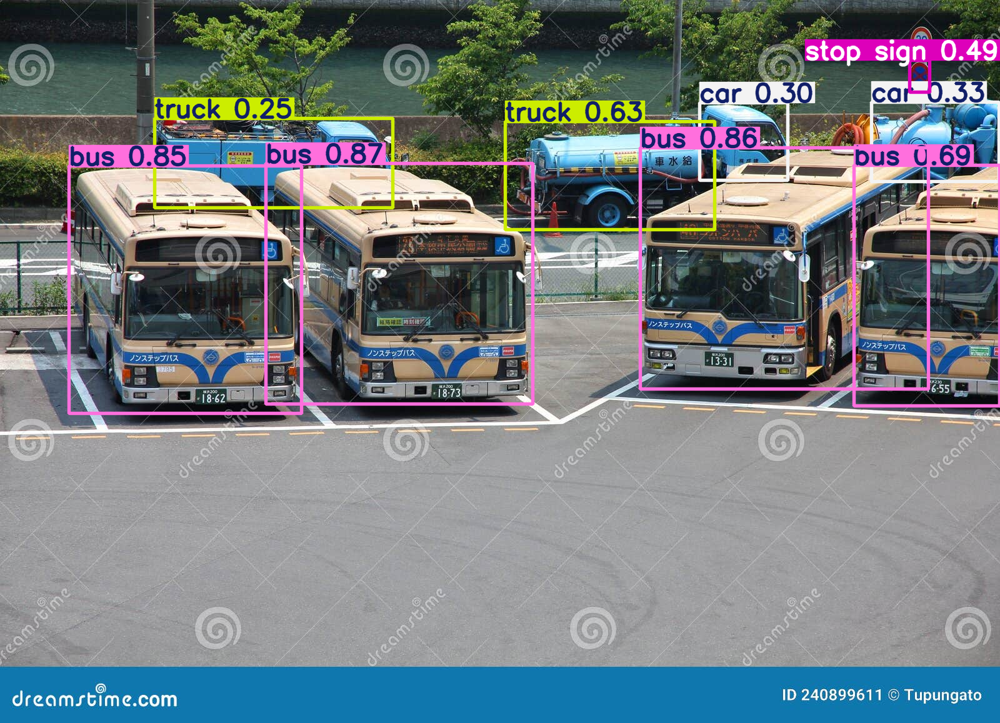

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(results[0].plot())

100%|██████████| 134k/134k [00:00<00:00, 1.44MB/s]


image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 270.6ms
Speed: 14.1ms preprocess, 270.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)


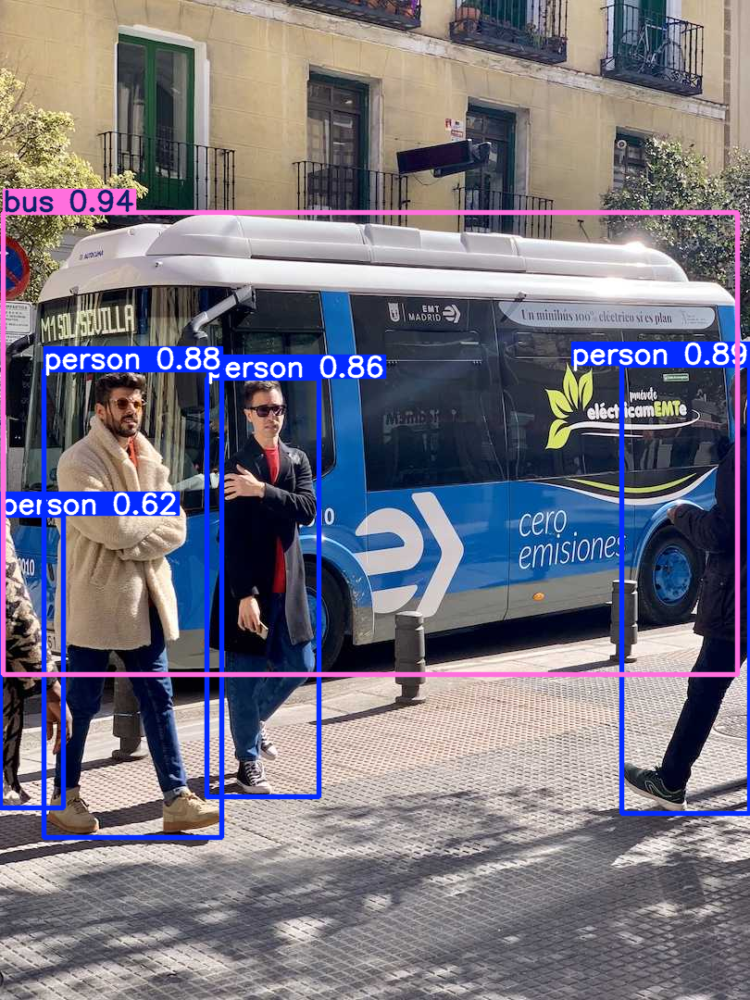

In [ ]:
results = model("https://ultralytics.com/images/bus.jpg")
from google.colab.patches import cv2_imshow
cv2_imshow(results[0].plot())

### [fine tuning](https://docs.ultralytics.com/datasets/detect/)

In [ ]:
!git clone https://github.com/ultralytics/ultralytics.git

Cloning into 'ultralytics'...
remote: Enumerating objects: 46408, done.
remote: Counting objects: 100% (410/410), done.
remote: Compressing objects: 100% (266/266), done.
remote: Total 46408 (delta 307), reused 155 (delta 144), pack-reused 45998 (from 3)
Receiving objects: 100% (46408/46408), 39.29 MiB | 14.28 MiB/s, done.
Resolving deltas: 100% (34443/34443), done.


In [ ]:
from ultralytics import YOLO

# Load a pretrained model
model = YOLO("yolo11n.pt")

# Train the model on your custom dataset
model.train(data="ultralytics/cfg/datasets/coco8.yaml", epochs=3, imgsz=640)

Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=ultralytics/cfg/datasets/coco8.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show

100%|██████████| 433k/433k [00:00<00:00, 2.18MB/s]
Unzipping /content/datasets/coco8.zip to /content/datasets/coco8...: 100%|██████████| 25/25 [00:00<00:00, 783.16file/s]

Dataset download success ✅ (2.1s), saved to /content/datasets



100%|██████████| 755k/755k [00:00<00:00, 3.86MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

train: Scanning /content/datasets/coco8/labels/train... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 1437.51it/s]

train: New cache created: /content/datasets/coco8/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.24 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/coco8/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 7796.10it/s]

val: New cache created: /content/datasets/coco8/labels/val.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3         0G      1.365      3.625      1.786         19        640: 100%|██████████| 1/1 [00:04<00:00,  4.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

                   all          4         17       0.56       0.85       0.88      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3         0G      1.181      2.736      1.443         34        640: 100%|██████████| 1/1 [00:04<00:00,  4.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

                   all          4         17      0.559       0.85      0.892      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3         0G      1.048      2.629        1.2         29        640: 100%|██████████| 1/1 [00:03<00:00,  3.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]

                   all          4         17      0.556       0.85      0.854      0.636



3 epochs completed in 0.009 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]


                   all          4         17       0.56       0.85      0.892       0.64
                person          3         10      0.559        0.6      0.626      0.299
                   dog          1          1      0.541          1      0.995      0.697
                 horse          1          2      0.491          1      0.995      0.674
              elephant          1          2      0.361        0.5      0.745      0.282
              umbrella          1          1      0.565          1      0.995      0.995
          potted plant          1          1      0.846          1      0.995      0.895
Speed: 4.2ms preprocess, 450.9ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0, 16, 17, 20, 25, 58])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7abd5bd7d750>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,

## [image segmentation](https://docs.ultralytics.com/tasks/segment/)

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-seg.pt")  # load an official model

# Predict with the model
results = model("https://ultralytics.com/images/bus.jpg")  # predict on an image

100%|██████████| 5.90M/5.90M [00:00<00:00, 17.6MB/s]



Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 434.0ms
Speed: 12.4ms preprocess, 434.0ms inference, 35.3ms postprocess per image at shape (1, 3, 640, 480)


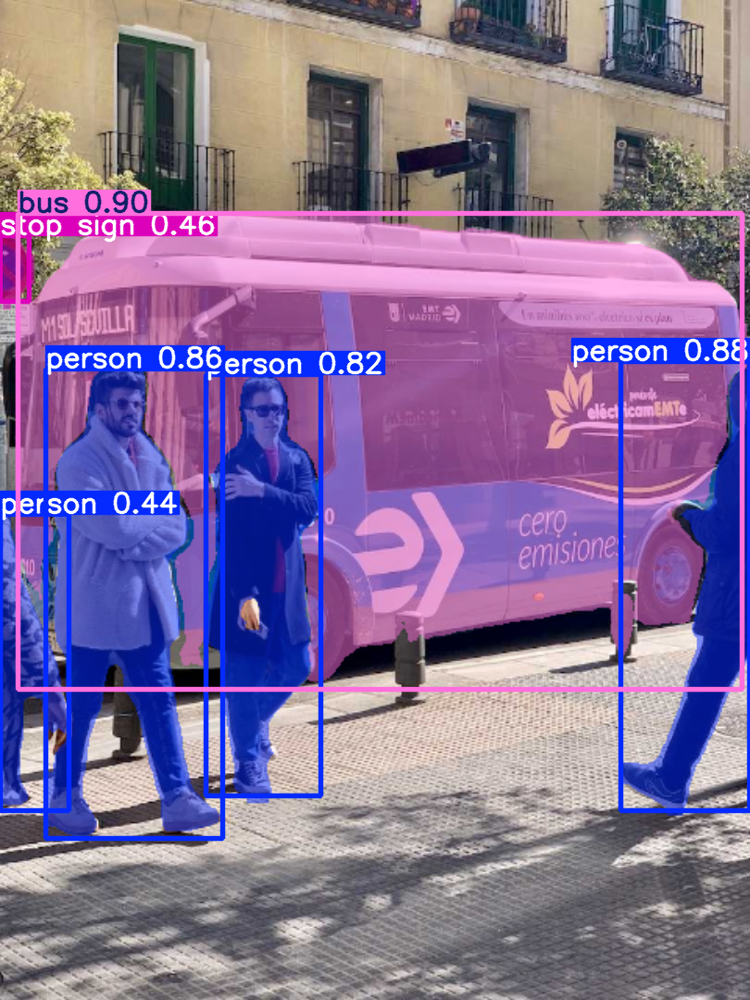

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(results[0].plot())

# [diffusion](https://towardsdatascience.com/diffusion-model-from-scratch-in-pytorch-ddpm-9d9760528946)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from einops import rearrange #pip install einops
from typing import List
import random
import math
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from timm.utils import ModelEmaV3 #pip install timm
from tqdm import tqdm #pip install tqdm
import matplotlib.pyplot as plt #pip install matplotlib
import torch.optim as optim
import numpy as np

class SinusoidalEmbeddings(nn.Module):
    def __init__(self, time_steps:int, embed_dim: int):
        super().__init__()
        position = torch.arange(time_steps).unsqueeze(1).float()
        div = torch.exp(torch.arange(0, embed_dim, 2).float() * -(math.log(10000.0) / embed_dim))
        embeddings = torch.zeros(time_steps, embed_dim, requires_grad=False)
        embeddings[:, 0::2] = torch.sin(position * div)
        embeddings[:, 1::2] = torch.cos(position * div)
        self.embeddings = embeddings

    def forward(self, x, t):
        embeds = self.embeddings[t].to(x.device)
        return embeds[:, :, None, None]

In [ ]:
# Residual Blocks
class ResBlock(nn.Module):
    def __init__(self, C: int, num_groups: int, dropout_prob: float):
        super().__init__()
        self.relu = nn.ReLU(inplace=True)
        self.gnorm1 = nn.GroupNorm(num_groups=num_groups, num_channels=C)
        self.gnorm2 = nn.GroupNorm(num_groups=num_groups, num_channels=C)
        self.conv1 = nn.Conv2d(C, C, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(C, C, kernel_size=3, padding=1)
        self.dropout = nn.Dropout(p=dropout_prob, inplace=True)

    def forward(self, x, embeddings):
        x = x + embeddings[:, :x.shape[1], :, :]
        r = self.conv1(self.relu(self.gnorm1(x)))
        r = self.dropout(r)
        r = self.conv2(self.relu(self.gnorm2(r)))
        return r + x

In [ ]:
class Attention(nn.Module):
    def __init__(self, C: int, num_heads:int , dropout_prob: float):
        super().__init__()
        self.proj1 = nn.Linear(C, C*3)
        self.proj2 = nn.Linear(C, C)
        self.num_heads = num_heads
        self.dropout_prob = dropout_prob

    def forward(self, x):
        h, w = x.shape[2:]
        x = rearrange(x, 'b c h w -> b (h w) c')
        x = self.proj1(x)
        x = rearrange(x, 'b L (C H K) -> K b H L C', K=3, H=self.num_heads)
        q,k,v = x[0], x[1], x[2]
        x = F.scaled_dot_product_attention(q,k,v, is_causal=False, dropout_p=self.dropout_prob)
        x = rearrange(x, 'b H (h w) C -> b h w (C H)', h=h, w=w)
        x = self.proj2(x)
        return rearrange(x, 'b h w C -> b C h w')

In [ ]:
class UnetLayer(nn.Module):
    def __init__(self,
            upscale: bool,
            attention: bool,
            num_groups: int,
            dropout_prob: float,
            num_heads: int,
            C: int):
        super().__init__()
        self.ResBlock1 = ResBlock(C=C, num_groups=num_groups, dropout_prob=dropout_prob)
        self.ResBlock2 = ResBlock(C=C, num_groups=num_groups, dropout_prob=dropout_prob)
        if upscale:
            self.conv = nn.ConvTranspose2d(C, C//2, kernel_size=4, stride=2, padding=1)
        else:
            self.conv = nn.Conv2d(C, C*2, kernel_size=3, stride=2, padding=1)
        if attention:
            self.attention_layer = Attention(C, num_heads=num_heads, dropout_prob=dropout_prob)

    def forward(self, x, embeddings):
        x = self.ResBlock1(x, embeddings)
        if hasattr(self, 'attention_layer'):
            x = self.attention_layer(x)
        x = self.ResBlock2(x, embeddings)
        return self.conv(x), x

In [ ]:
class UNET(nn.Module):
    def __init__(self,
            Channels: List = [64, 128, 256, 512, 512, 384],
            Attentions: List = [False, True, False, False, False, True],
            Upscales: List = [False, False, False, True, True, True],
            num_groups: int = 32,
            dropout_prob: float = 0.1,
            num_heads: int = 8,
            input_channels: int = 1,
            output_channels: int = 1,
            time_steps: int = 1000):
        super().__init__()
        self.num_layers = len(Channels)
        self.shallow_conv = nn.Conv2d(input_channels, Channels[0], kernel_size=3, padding=1)
        out_channels = (Channels[-1]//2)+Channels[0]
        self.late_conv = nn.Conv2d(out_channels, out_channels//2, kernel_size=3, padding=1)
        self.output_conv = nn.Conv2d(out_channels//2, output_channels, kernel_size=1)
        self.relu = nn.ReLU(inplace=True)
        self.embeddings = SinusoidalEmbeddings(time_steps=time_steps, embed_dim=max(Channels))
        for i in range(self.num_layers):
            layer = UnetLayer(
                upscale=Upscales[i],
                attention=Attentions[i],
                num_groups=num_groups,
                dropout_prob=dropout_prob,
                C=Channels[i],
                num_heads=num_heads
            )
            setattr(self, f'Layer{i+1}', layer)

    def forward(self, x, t):
        x = self.shallow_conv(x)
        residuals = []
        for i in range(self.num_layers//2):
            layer = getattr(self, f'Layer{i+1}')
            embeddings = self.embeddings(x, t)
            x, r = layer(x, embeddings)
            residuals.append(r)
        for i in range(self.num_layers//2, self.num_layers):
            layer = getattr(self, f'Layer{i+1}')
            x = torch.concat((layer(x, embeddings)[0], residuals[self.num_layers-i-1]), dim=1)
        return self.output_conv(self.relu(self.late_conv(x)))

In [ ]:
class DDPM_Scheduler(nn.Module):
    def __init__(self, num_time_steps: int=1000):
        super().__init__()
        self.beta = torch.linspace(1e-4, 0.02, num_time_steps, requires_grad=False)
        alpha = 1 - self.beta
        self.alpha = torch.cumprod(alpha, dim=0).requires_grad_(False)

    def forward(self, t):
        return self.beta[t], self.alpha[t]

In [ ]:
def set_seed(seed: int = 42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    random.seed(seed)

In [ ]:
def train(batch_size: int=64,
          num_time_steps: int=1000,
          num_epochs: int=15,
          seed: int=-1,
          ema_decay: float=0.9999,
          lr=2e-5,
          checkpoint_path: str=None):
    set_seed(random.randint(0, 2**32-1)) if seed == -1 else set_seed(seed)

    train_dataset = datasets.MNIST(root='./data', train=True, download=True,transform=transforms.ToTensor())
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True, num_workers=4)

    scheduler = DDPM_Scheduler(num_time_steps=num_time_steps)
    model = UNET().cuda()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    ema = ModelEmaV3(model, decay=ema_decay)
    if checkpoint_path is not None:
        checkpoint = torch.load(checkpoint_path)
        model.load_state_dict(checkpoint['weights'])
        ema.load_state_dict(checkpoint['ema'])
        optimizer.load_state_dict(checkpoint['optimizer'])
    criterion = nn.MSELoss(reduction='mean')

    for i in range(num_epochs):
        total_loss = 0
        for bidx, (x,_) in enumerate(tqdm(train_loader, desc=f"Epoch {i+1}/{num_epochs}")):
            x = x.cuda()
            x = F.pad(x, (2,2,2,2))
            t = torch.randint(0,num_time_steps,(batch_size,))
            e = torch.randn_like(x, requires_grad=False)
            a = scheduler.alpha[t].view(batch_size,1,1,1).cuda()
            x = (torch.sqrt(a)*x) + (torch.sqrt(1-a)*e)
            output = model(x, t)
            optimizer.zero_grad()
            loss = criterion(output, e)
            total_loss += loss.item()
            loss.backward()
            optimizer.step()
            ema.update(model)
        print(f'Epoch {i+1} | Loss {total_loss / (60000/batch_size):.5f}')

    checkpoint = {
        'weights': model.state_dict(),
        'optimizer': optimizer.state_dict(),
        'ema': ema.state_dict()
    }
    torch.save(checkpoint, 'checkpoints/ddpm_checkpoint')

In [ ]:
def display_reverse(images: List):
    fig, axes = plt.subplots(1, 10, figsize=(10,1))
    for i, ax in enumerate(axes.flat):
        x = images[i].squeeze(0)
        x = rearrange(x, 'c h w -> h w c')
        x = x.numpy()
        ax.imshow(x)
        ax.axis('off')
    plt.show()

def inference(checkpoint_path: str=None,
              num_time_steps: int=1000,
              ema_decay: float=0.9999, ):
    checkpoint = torch.load(checkpoint_path)
    model = UNET().cuda()
    model.load_state_dict(checkpoint['weights'])
    ema = ModelEmaV3(model, decay=ema_decay)
    ema.load_state_dict(checkpoint['ema'])
    scheduler = DDPM_Scheduler(num_time_steps=num_time_steps)
    times = [0,15,50,100,200,300,400,550,700,999]
    images = []

    with torch.no_grad():
        model = ema.module.eval()
        for i in range(10):
            z = torch.randn(1, 1, 32, 32)
            for t in reversed(range(1, num_time_steps)):
                t = [t]
                temp = (scheduler.beta[t]/( (torch.sqrt(1-scheduler.alpha[t]))*(torch.sqrt(1-scheduler.beta[t])) ))
                z = (1/(torch.sqrt(1-scheduler.beta[t])))*z - (temp*model(z.cuda(),t).cpu())
                if t[0] in times:
                    images.append(z)
                e = torch.randn(1, 1, 32, 32)
                z = z + (e*torch.sqrt(scheduler.beta[t]))
            temp = scheduler.beta[0]/( (torch.sqrt(1-scheduler.alpha[0]))*(torch.sqrt(1-scheduler.beta[0])) )
            x = (1/(torch.sqrt(1-scheduler.beta[0])))*z - (temp*model(z.cuda(),[0]).cpu())

            images.append(x)
            x = rearrange(x.squeeze(0), 'c h w -> h w c').detach()
            x = x.numpy()
            plt.imshow(x)
            plt.show()
            display_reverse(images)
            images = []

In [ ]:
!mkdir -p checkpoints/ddpm_checkpoint

In [ ]:
import os
def main():
    # Check if checkpoint file exists, otherwise start from scratch
    checkpoint_file = '/content/checkpoints/ddpm_checkpoint/'  # Example filename
    if os.path.isfile(checkpoint_file):
        train(checkpoint_path=checkpoint_file, lr=2e-5, num_epochs=3)
    else:
        train(lr=2e-5, num_epochs=75)  # Start fresh training
    inference(checkpoint_file)  # Use the same filename for inference

if __name__ == '__main__':
    main()

Epoch 1/75: 100%|██████████| 937/937 [04:53<00:00,  3.20it/s]


Epoch 1 | Loss 0.13607


Epoch 2/75: 100%|██████████| 937/937 [04:53<00:00,  3.19it/s]


Epoch 2 | Loss 0.05004


Epoch 3/75: 100%|██████████| 937/937 [04:53<00:00,  3.19it/s]


Epoch 3 | Loss 0.03839


Epoch 4/75: 100%|██████████| 937/937 [04:53<00:00,  3.19it/s]


Epoch 4 | Loss 0.03226


Epoch 5/75:  19%|█▊        | 175/937 [00:55<03:59,  3.18it/s]

## [huggingface](https://huggingface.co/learn/diffusion-course/unit1/3)

In [ ]:
%pip install -q diffusers

In [ ]:
import torch
import torchvision
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from diffusers import DDPMScheduler, UNet2DModel
from matplotlib import pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Using device: cpu


data

In [ ]:
dataset = torchvision.datasets.MNIST(
    root="mnist/", train=True, download=True, transform=torchvision.transforms.ToTensor()
)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9.91M/9.91M [00:00<00:00, 14.6MB/s]


Extracting mnist/MNIST/raw/train-images-idx3-ubyte.gz to mnist/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28.9k/28.9k [00:00<00:00, 41.6MB/s]

Extracting mnist/MNIST/raw/train-labels-idx1-ubyte.gz to mnist/MNIST/raw



Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1.65M/1.65M [00:00<00:00, 3.74MB/s]


Extracting mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to mnist/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4.54k/4.54k [00:00<00:00, 6.90MB/s]

Extracting mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to mnist/MNIST/raw



In [ ]:
train_dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

Input shape: torch.Size([8, 1, 28, 28])
Labels: tensor([1, 3, 8, 6, 8, 5, 4, 7])


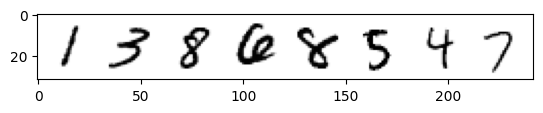

In [ ]:
x, y = next(iter(train_dataloader))
print("Input shape:", x.shape)
print("Labels:", y)
plt.imshow(torchvision.utils.make_grid(x)[0], cmap="Greys")

In [ ]:
# noise
def corrupt(x, amount):
    """Corrupt the input `x` by mixing it with noise according to `amount`"""
    noise = torch.rand_like(x)
    amount = amount.view(-1, 1, 1, 1)  # Sort shape so broadcasting works
    return x * (1 - amount) + noise * amount

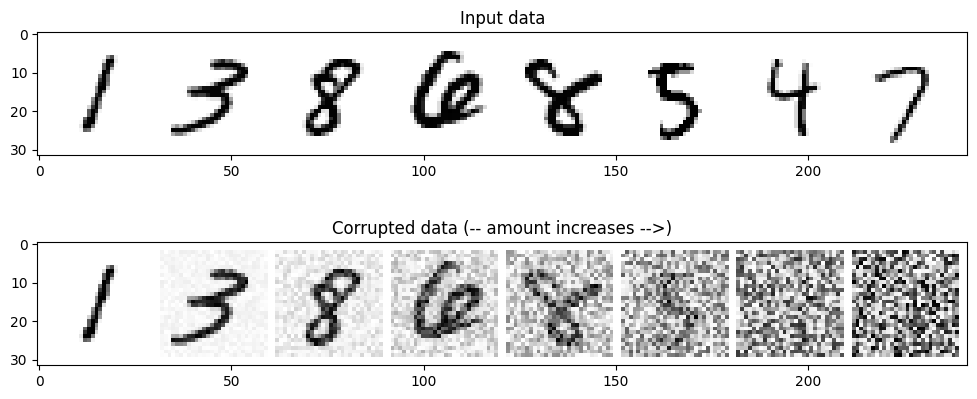

In [ ]:
# Plotting the input data
fig, axs = plt.subplots(2, 1, figsize=(12, 5))
axs[0].set_title("Input data")
axs[0].imshow(torchvision.utils.make_grid(x)[0], cmap="Greys")

# Adding noise
amount = torch.linspace(0, 1, x.shape[0])  # Left to right -> more corruption
noised_x = corrupt(x, amount)

# Plotting the noised version
axs[1].set_title("Corrupted data (-- amount increases -->)")
axs[1].imshow(torchvision.utils.make_grid(noised_x)[0], cmap="Greys")

model

In [ ]:
class BasicUNet(nn.Module):
    """A minimal UNet implementation."""

    def __init__(self, in_channels=1, out_channels=1):
        super().__init__()
        self.down_layers = torch.nn.ModuleList(
            [
                nn.Conv2d(in_channels, 32, kernel_size=5, padding=2),
                nn.Conv2d(32, 64, kernel_size=5, padding=2),
                nn.Conv2d(64, 64, kernel_size=5, padding=2),
            ]
        )
        self.up_layers = torch.nn.ModuleList(
            [
                nn.Conv2d(64, 64, kernel_size=5, padding=2),
                nn.Conv2d(64, 32, kernel_size=5, padding=2),
                nn.Conv2d(32, out_channels, kernel_size=5, padding=2),
            ]
        )
        self.act = nn.SiLU()  # The activation function
        self.downscale = nn.MaxPool2d(2)
        self.upscale = nn.Upsample(scale_factor=2)

    def forward(self, x):
        h = []
        for i, l in enumerate(self.down_layers):
            x = self.act(l(x))  # Through the layer and the activation function
            if i < 2:  # For all but the third (final) down layer:
                h.append(x)  # Storing output for skip connection
                x = self.downscale(x)  # Downscale ready for the next layer

        for i, l in enumerate(self.up_layers):
            if i > 0:  # For all except the first up layer
                x = self.upscale(x)  # Upscale
                x += h.pop()  # Fetching stored output (skip connection)
            x = self.act(l(x))  # Through the layer and the activation function

        return x

In [ ]:
net = BasicUNet()
x = torch.rand(8, 1, 28, 28)
net(x).shape

torch.Size([8, 1, 28, 28])

In [ ]:
sum([p.numel() for p in net.parameters()])

309057

training

Finished epoch 0. Average loss for this epoch: 0.026405
Finished epoch 1. Average loss for this epoch: 0.020218
Finished epoch 2. Average loss for this epoch: 0.018632


(0.0, 0.1)

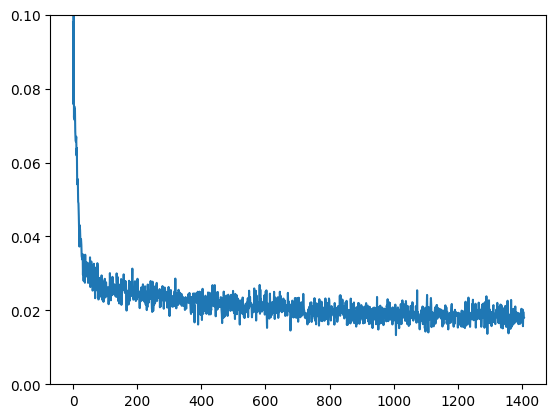

In [ ]:
# Dataloader (you can mess with batch size)
batch_size = 128
train_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# How many runs through the data should we do?
n_epochs = 3

# Create the network
net = BasicUNet()
net.to(device)

# Our loss function
loss_fn = nn.MSELoss()

# The optimizer
opt = torch.optim.Adam(net.parameters(), lr=1e-3)

# Keeping a record of the losses for later viewing
losses = []

# The training loop
for epoch in range(n_epochs):

    for x, y in train_dataloader:

        # Get some data and prepare the corrupted version
        x = x.to(device)  # Data on the GPU
        noise_amount = torch.rand(x.shape[0]).to(device)  # Pick random noise amounts
        noisy_x = corrupt(x, noise_amount)  # Create our noisy x

        # Get the model prediction
        pred = net(noisy_x)

        # Calculate the loss
        loss = loss_fn(pred, x)  # How close is the output to the true 'clean' x?

        # Backprop and update the params:
        opt.zero_grad()
        loss.backward()
        opt.step()

        # Store the loss for later
        losses.append(loss.item())

    # Print our the average of the loss values for this epoch:
    avg_loss = sum(losses[-len(train_dataloader) :]) / len(train_dataloader)
    print(f"Finished epoch {epoch}. Average loss for this epoch: {avg_loss:05f}")

# View the loss curve
plt.plot(losses)
plt.ylim(0, 0.1)

prediksi

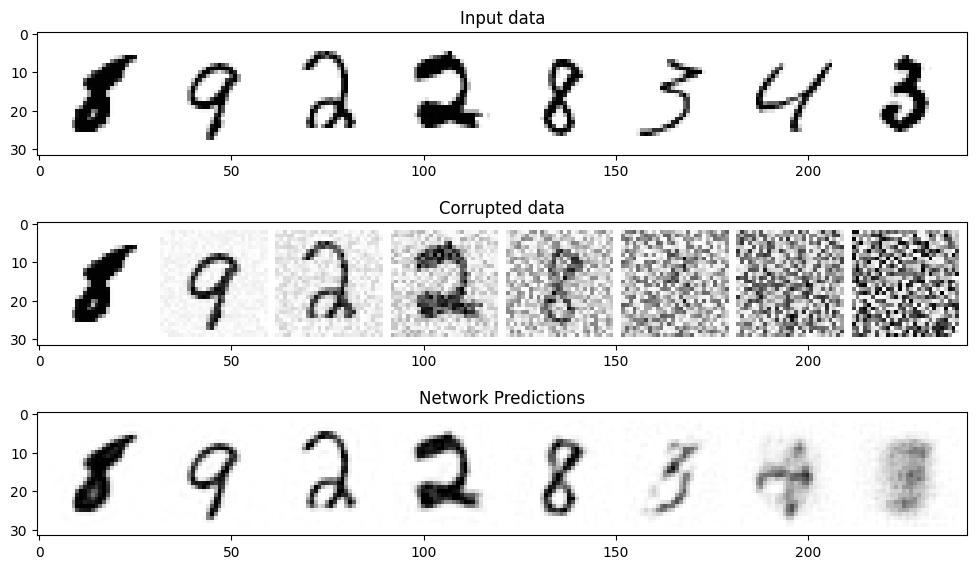

In [ ]:
# Visualizing model predictions on noisy inputs:

# Fetch some data
x, y = next(iter(train_dataloader))
x = x[:8]  # Only using the first 8 for easy plotting

# Corrupt with a range of amounts
amount = torch.linspace(0, 1, x.shape[0])  # Left to right -> more corruption
noised_x = corrupt(x, amount)

# Get the model predictions
with torch.no_grad():
    preds = net(noised_x.to(device)).detach().cpu()

# Plot
fig, axs = plt.subplots(3, 1, figsize=(12, 7))
axs[0].set_title("Input data")
axs[0].imshow(torchvision.utils.make_grid(x)[0].clip(0, 1), cmap="Greys")
axs[1].set_title("Corrupted data")
axs[1].imshow(torchvision.utils.make_grid(noised_x)[0].clip(0, 1), cmap="Greys")
axs[2].set_title("Network Predictions")
axs[2].imshow(torchvision.utils.make_grid(preds)[0].clip(0, 1), cmap="Greys")

sampling

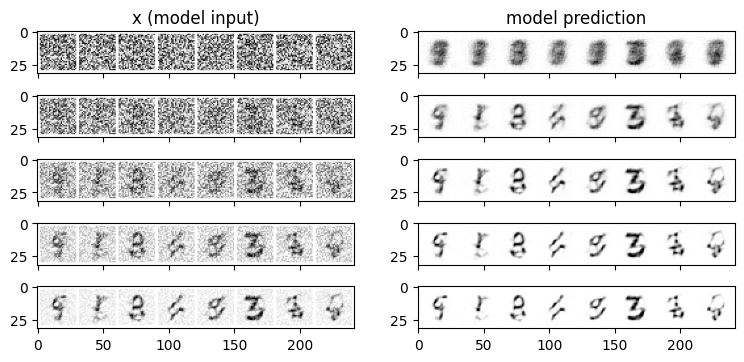

In [ ]:
# Sampling strategy: Break the process into 5 steps and move 1/5'th of the way there each time:
n_steps = 5
x = torch.rand(8, 1, 28, 28).to(device)  # Start from random
step_history = [x.detach().cpu()]
pred_output_history = []

for i in range(n_steps):
    with torch.no_grad():  # No need to track gradients during inference
        pred = net(x)  # Predict the denoised x0
    pred_output_history.append(pred.detach().cpu())  # Store model output for plotting
    mix_factor = 1 / (n_steps - i)  # How much we move towards the prediction
    x = x * (1 - mix_factor) + pred * mix_factor  # Move part of the way there
    step_history.append(x.detach().cpu())  # Store step for plotting

fig, axs = plt.subplots(n_steps, 2, figsize=(9, 4), sharex=True)
axs[0, 0].set_title("x (model input)")
axs[0, 1].set_title("model prediction")
for i in range(n_steps):
    axs[i, 0].imshow(torchvision.utils.make_grid(step_history[i])[0].clip(0, 1), cmap="Greys")
    axs[i, 1].imshow(torchvision.utils.make_grid(pred_output_history[i])[0].clip(0, 1), cmap="Greys")

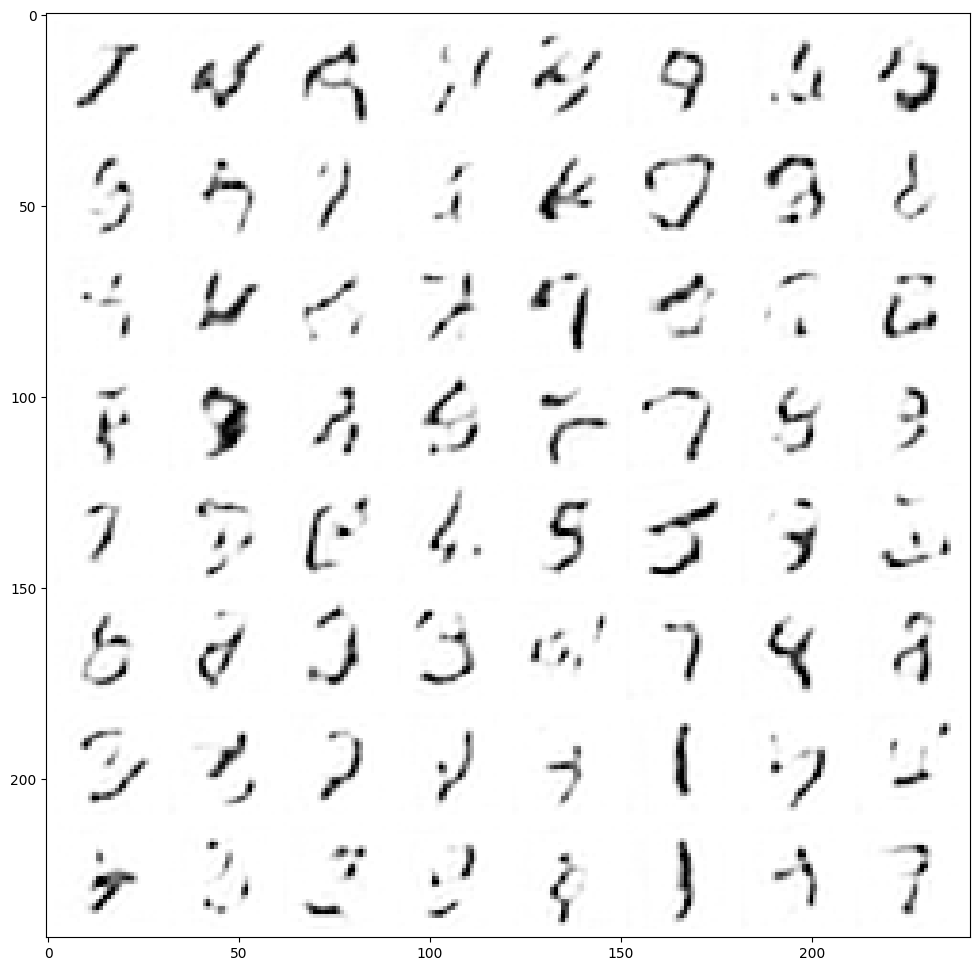

In [ ]:
# Showing more results, using 40 sampling steps
n_steps = 40
x = torch.rand(64, 1, 28, 28).to(device)
for i in range(n_steps):
    noise_amount = torch.ones((x.shape[0],)).to(device) * (1 - (i / n_steps))  # Starting high going low
    with torch.no_grad():
        pred = net(x)
    mix_factor = 1 / (n_steps - i)
    x = x * (1 - mix_factor) + pred * mix_factor
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ax.imshow(torchvision.utils.make_grid(x.detach().cpu(), nrow=8)[0].clip(0, 1), cmap="Greys")

perbandingan dengan DDPM

U-Net

In [ ]:
model = UNet2DModel(
    sample_size=28,  # the target image resolution
    in_channels=1,  # the number of input channels, 3 for RGB images
    out_channels=1,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(32, 64, 64),  # Roughly matching our basic unet example
    down_block_types=(
        "DownBlock2D",  # a regular ResNet downsampling block
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "AttnDownBlock2D",
    ),
    up_block_types=(
        "AttnUpBlock2D",
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",  # a regular ResNet upsampling block
    ),
)
print(model)

UNet2DModel(
  (conv_in): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=32, out_features=128, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=128, out_features=128, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 32, eps=1e-05, affine=True)
          (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=128, out_features=32, bias=True)
          (norm2): GroupNorm(32, 32, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Conv2d(32, 32, ker

In [ ]:
sum([p.numel() for p in model.parameters()])  # 1.7M vs the ~309k parameters of the BasicUNet

1707009

Finished epoch 0. Average loss for this epoch: 0.020818
Finished epoch 1. Average loss for this epoch: 0.013202
Finished epoch 2. Average loss for this epoch: 0.011813


Text(0.5, 1.0, 'Generated Samples')

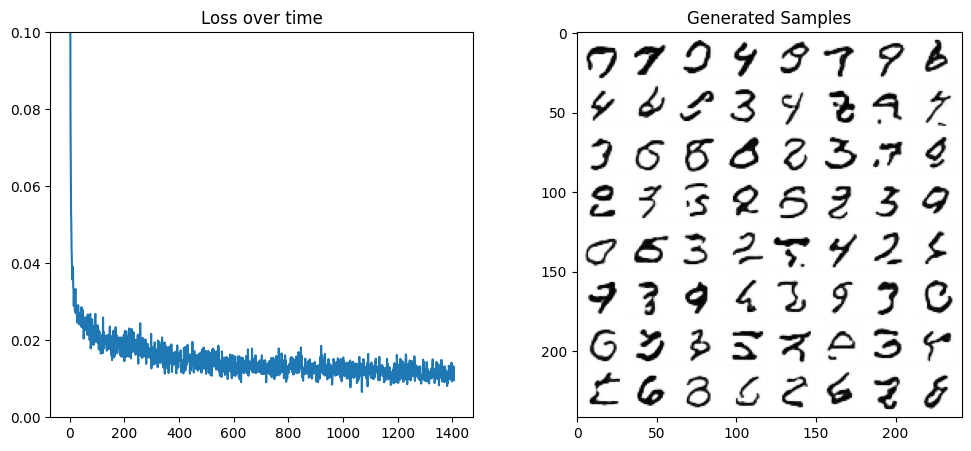

In [ ]:
# Trying UNet2DModel instead of BasicUNet:

# Dataloader (you can mess with batch size)
batch_size = 128
train_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# How many runs through the data should we do?
n_epochs = 3

# Create the network
net = UNet2DModel(
    sample_size=28,  # the target image resolution
    in_channels=1,  # the number of input channels, 3 for RGB images
    out_channels=1,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(32, 64, 64),  # Roughly matching our basic unet example
    down_block_types=(
        "DownBlock2D",  # a regular ResNet downsampling block
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "AttnDownBlock2D",
    ),
    up_block_types=(
        "AttnUpBlock2D",
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",  # a regular ResNet upsampling block
    ),
)  # <<<
net.to(device)

# Our loss finction
loss_fn = nn.MSELoss()

# The optimizer
opt = torch.optim.Adam(net.parameters(), lr=1e-3)

# Keeping a record of the losses for later viewing
losses = []

# The training loop
for epoch in range(n_epochs):

    for x, y in train_dataloader:

        # Get some data and prepare the corrupted version
        x = x.to(device)  # Data on the GPU
        noise_amount = torch.rand(x.shape[0]).to(device)  # Pick random noise amounts
        noisy_x = corrupt(x, noise_amount)  # Create our noisy x

        # Get the model prediction
        pred = net(noisy_x, 0).sample  # <<< Using timestep 0 always, adding .sample

        # Calculate the loss
        loss = loss_fn(pred, x)  # How close is the output to the true 'clean' x?

        # Backprop and update the params:
        opt.zero_grad()
        loss.backward()
        opt.step()

        # Store the loss for later
        losses.append(loss.item())

    # Print our the average of the loss values for this epoch:
    avg_loss = sum(losses[-len(train_dataloader) :]) / len(train_dataloader)
    print(f"Finished epoch {epoch}. Average loss for this epoch: {avg_loss:05f}")

# Plot losses and some samples
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Losses
axs[0].plot(losses)
axs[0].set_ylim(0, 0.1)
axs[0].set_title("Loss over time")

# Samples
n_steps = 40
x = torch.rand(64, 1, 28, 28).to(device)
for i in range(n_steps):
    noise_amount = torch.ones((x.shape[0],)).to(device) * (1 - (i / n_steps))  # Starting high going low
    with torch.no_grad():
        pred = net(x, 0).sample
    mix_factor = 1 / (n_steps - i)
    x = x * (1 - mix_factor) + pred * mix_factor

axs[1].imshow(torchvision.utils.make_grid(x.detach().cpu(), nrow=8)[0].clip(0, 1), cmap="Greys")
axs[1].set_title("Generated Samples")

corrupt

tambahkan noise

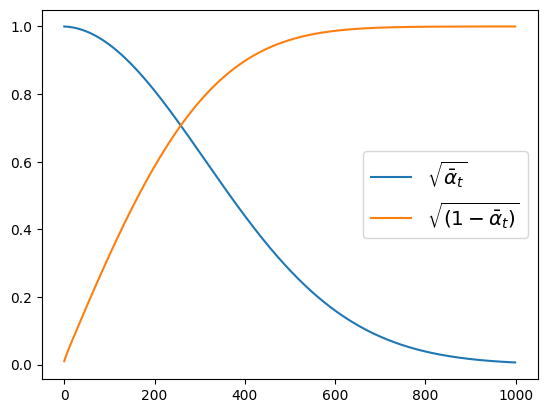

In [ ]:
noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
plt.plot(noise_scheduler.alphas_cumprod.cpu() ** 0.5, label=r"${\sqrt{\bar{\alpha}_t}}$")
plt.plot((1 - noise_scheduler.alphas_cumprod.cpu()) ** 0.5, label=r"$\sqrt{(1 - \bar{\alpha}_t)}$")
plt.legend(fontsize="x-large")

X shape torch.Size([8, 1, 28, 28])
Noisy X shape torch.Size([8, 1, 28, 28])


Text(0.5, 1.0, 'Noisy X')

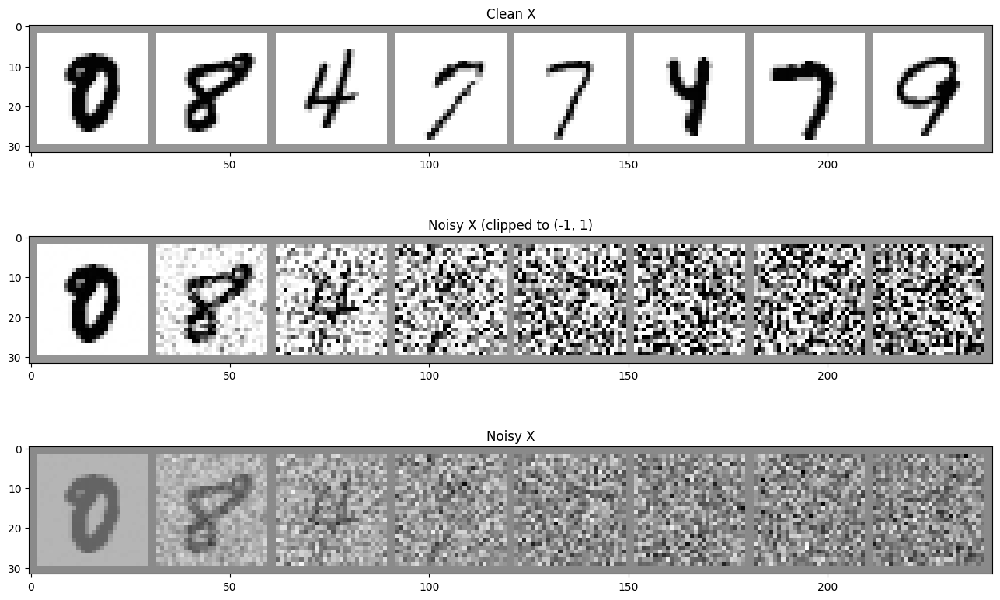

In [ ]:
# visualize the DDPM noising process for different timesteps:

# Noise a batch of images to view the effect
fig, axs = plt.subplots(3, 1, figsize=(16, 10))
xb, yb = next(iter(train_dataloader))
xb = xb.to(device)[:8]
xb = xb * 2.0 - 1.0  # Map to (-1, 1)
print("X shape", xb.shape)

# Show clean inputs
axs[0].imshow(torchvision.utils.make_grid(xb[:8])[0].detach().cpu(), cmap="Greys")
axs[0].set_title("Clean X")

# Add noise with scheduler
timesteps = torch.linspace(0, 999, 8).long().to(device)
noise = torch.randn_like(xb)  # << NB: randn not rand
noisy_xb = noise_scheduler.add_noise(xb, noise, timesteps)
print("Noisy X shape", noisy_xb.shape)

# Show noisy version (with and without clipping)
axs[1].imshow(torchvision.utils.make_grid(noisy_xb[:8])[0].detach().cpu().clip(-1, 1), cmap="Greys")
axs[1].set_title("Noisy X (clipped to (-1, 1)")
axs[2].imshow(torchvision.utils.make_grid(noisy_xb[:8])[0].detach().cpu(), cmap="Greys")
axs[2].set_title("Noisy X")

In [ ]:
# noise = torch.randn_like(xb) # << NB: randn not rand
# noisy_x = noise_scheduler.add_noise(x, noise, timesteps)
# model_prediction = model(noisy_x, timesteps).sample
# loss = mse_loss(model_prediction, noise) # noise as the target

In [ ]:
import torch.nn as nn

# ... (rest of the code) ...

# Get some data and prepare the corrupted version
x = xb  # Use the same batch of images used for noise generation
x = x.to(device)  # Data on the GPU
noise_amount = torch.rand(x.shape[0]).to(device)  # Pick random noise amounts
noisy_x = corrupt(x, noise_amount)  # Create our noisy x
model_prediction = model(noisy_x, timesteps).sample

# Calculate the loss using nn.MSELoss()
loss_fn = nn.MSELoss() # Define the loss function
loss = loss_fn(model_prediction, noise) # Calculate the loss, replacing mse_loss with loss_fn